In [1]:
from astropy.io import fits
from astropy import units, constants
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import corner
from voigt_fit_lib import *
import os
import pickle

Load in the files

In [2]:
rootdir = '/Users/thepoetoftwilight/Documents/Astro/Data/PG1522+101/'

First, the FUV files

In [3]:
spec_fits_fuv = fits.open(rootdir + 'FUV/PG1522+101_FUV_wavecal_new.fits')
lsf_fits_fuv = fits.open(rootdir + 'FUV/PG1522_COS_FUV_wavcal2022_lsf_ZQ.fits')

Then, the NUV files

In [4]:
spec_fits_nuv = fits.open(rootdir + 'G185M/PG1522+101_NUV_wavecal_new.fits')
lsf_fits_nuv = fits.open(rootdir + 'G185M/PG1522_COS_NUV_wavcal2022_lsf.fits')

Then, the STIS files

In [5]:
spec_fits_stis = fits.open(rootdir + 'STIS/PG1522+101_E230M_new.fits')
lsf_fits_stis = fits.open(rootdir + 'STIS/PG1522_STIS_NUV_wavcal2022_lsf.fits')

Finally, HIRES files

In [6]:
spec_fits_hires = fits.open(rootdir + 'HIRES/PG1522+101_HIRES.fits')
lsf_fits_hires = fits.open(rootdir + 'HIRES/PG1522_HIRES_wavcal2023_lsf.fits')

Compile a list of the spectra, continuum nodes, and IDs for all detectors

In [7]:
spec_fits_list = [spec_fits_fuv, spec_fits_nuv, spec_fits_stis, spec_fits_hires]
lsf_fits_list = [lsf_fits_fuv, lsf_fits_nuv, lsf_fits_stis, lsf_fits_hires]

In [8]:
z_sys = 1.16590996 #1.16590953 #1.16590945 #1.16590931 #1.16590945 #1.16590988 #1.16590894

In [9]:
np.round(1.16590953+(1+1.16590953)*0.06/3e+5, 8)

1.16590996

# HI

## HI 1215 (STIS)

In [10]:
hi_1215_stis = ion_transition('HI', 1215, 'H', z_sys, 'STIS')

In [11]:
hi_1215_stis.grab_ion_transition_info()

In [12]:
hi_1215_stis.grab_ion_transition_spec(spec_fits_list,masks=[[70,120]])

In [13]:
hi_1215_stis.cont_norm_flux(renorm=True, v_abs_range=[-100,120], degree=1)

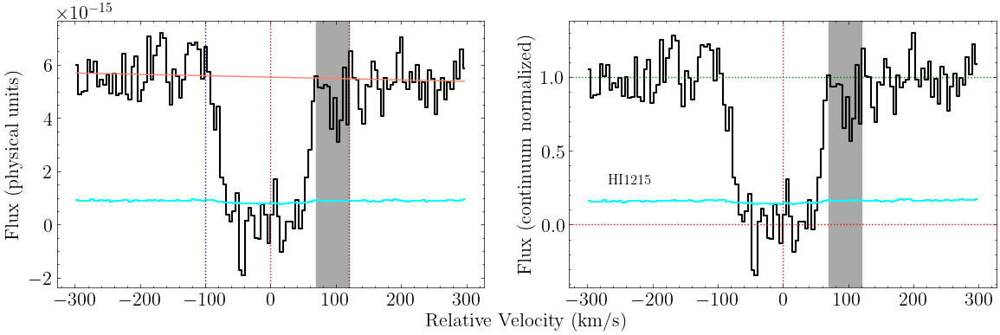

In [14]:
fig, axes = hi_1215_stis.plot_ion_transition_spec_cont()

In [15]:
hi_1215_stis.wav0_rest, hi_1215_stis.cont_params

(1215.6701, [5.534239672571766e-15, -5.227655652641758e-19])

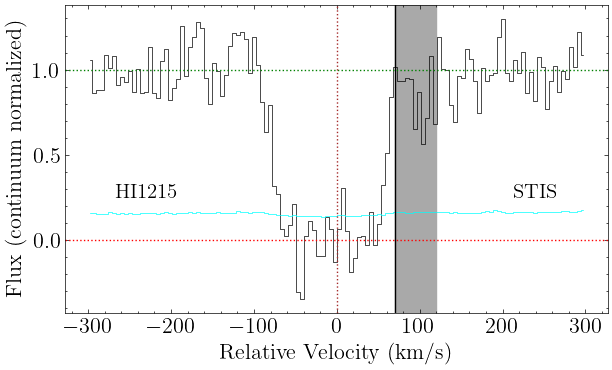

In [16]:
fig, axes = hi_1215_stis.plot_ion_transition_spec()
axes.axvline(70)

In [17]:
hi_1215_stis.get_EW_total(-100,70)

Integration window: [-100, 70]
EW, 1sig: 551, 17
EW-3sig: 51.556


In [18]:
hi_1215_stis.grab_ion_transition_lsf(lsf_fits_list)

In [19]:
hi_1215_stis.init_ion_transition(init_values = np.array([[16.52,21, 5],[14.69,29,-27]]), 
                             lsf_convolve = True)

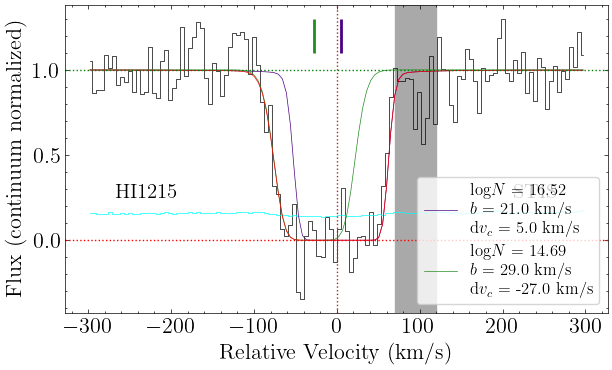

In [20]:
fig, ax = hi_1215_stis.plot_ion_transition_init_fit()

In [21]:
hi_1215_stis.fit_ion_transition()

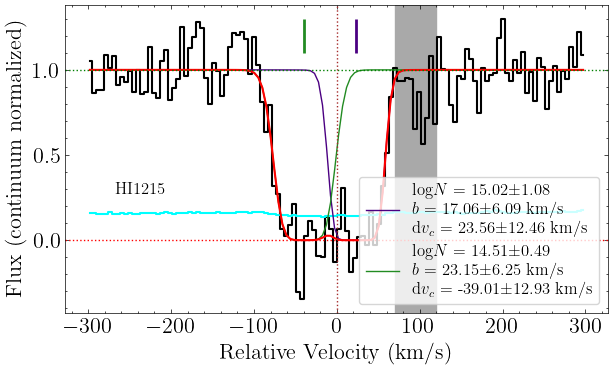

In [22]:
fig, ax = hi_1215_stis.plot_ion_transition_best_fit()

## HI 1025 (STIS)

In [23]:
hi_1025_stis = ion_transition('HI', 1025, 'H', z_sys, 'STIS')

In [24]:
hi_1025_stis.grab_ion_transition_info()

In [25]:
hi_1025_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-100,-60],[60,90]])

In [26]:
hi_1025_stis.cont_norm_flux(renorm=True, v_abs_range=[-100,90], degree=1)

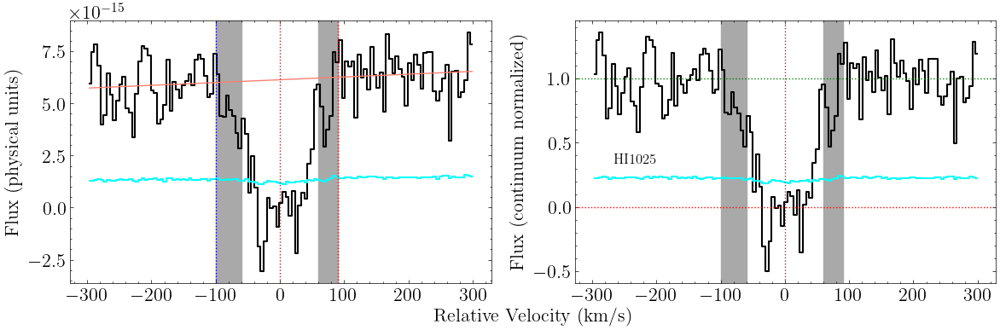

In [27]:
fig, axes = hi_1025_stis.plot_ion_transition_spec_cont()

In [28]:
hi_1025_stis.get_EW_total(-100,90)

Integration window: [-100, 90]
EW, 1sig: 411, 22
EW-3sig: 64.527


In [29]:
hi_1025_stis.grab_ion_transition_lsf(lsf_fits_list)

In [30]:
hi_1025_stis.init_ion_transition(init_values = np.array([[16.52,21, 5],[14.69,29,-27]]), 
                             lsf_convolve = True)

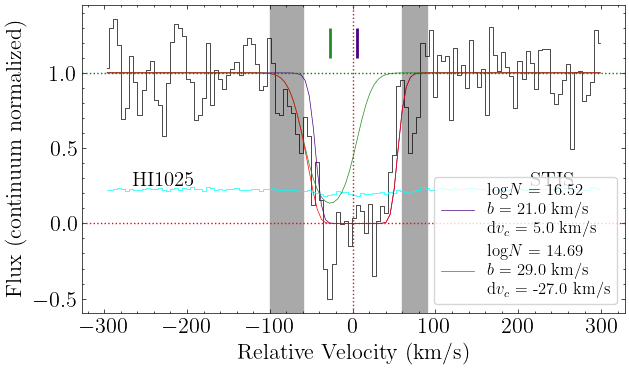

In [31]:
fig, ax = hi_1025_stis.plot_ion_transition_init_fit()

In [32]:
hi_1025_stis.fit_ion_transition()

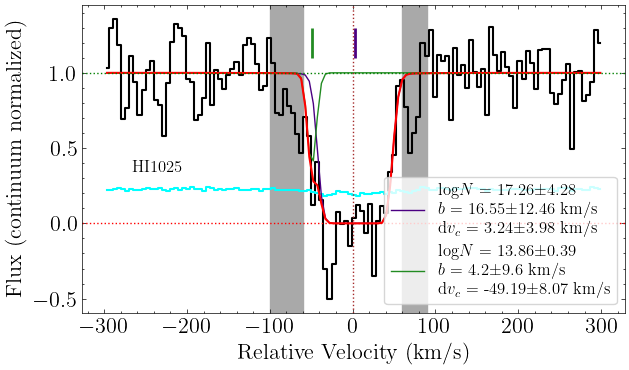

In [33]:
fig, ax = hi_1025_stis.plot_ion_transition_best_fit()

## HI 972 (STIS)

In [34]:
hi_972_stis = ion_transition('HI', 972, 'H', z_sys, 'STIS')

In [35]:
hi_972_stis.grab_ion_transition_info()

In [36]:
hi_972_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-200,-50]])

In [37]:
hi_972_stis.cont_norm_flux(renorm=True, v_abs_range=[-200,80], degree=1)

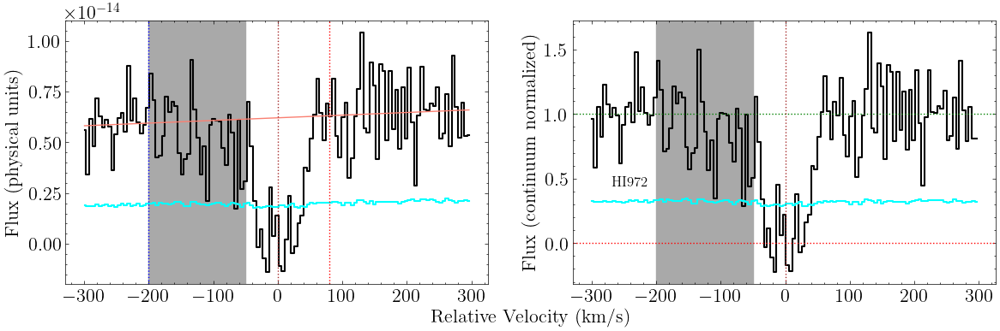

In [38]:
fig, axes = hi_972_stis.plot_ion_transition_spec_cont()

In [39]:
hi_972_stis.get_EW_total(-80,80)

Integration window: [-80, 80]
EW, 1sig: 285, 27
EW-3sig: 82.473


In [40]:
hi_972_stis.grab_ion_transition_lsf(lsf_fits_list)

In [41]:
hi_972_stis.init_ion_transition(init_values = np.array([[16.52,21, 5],[14.69,29,-27]]), 
                             lsf_convolve = True)

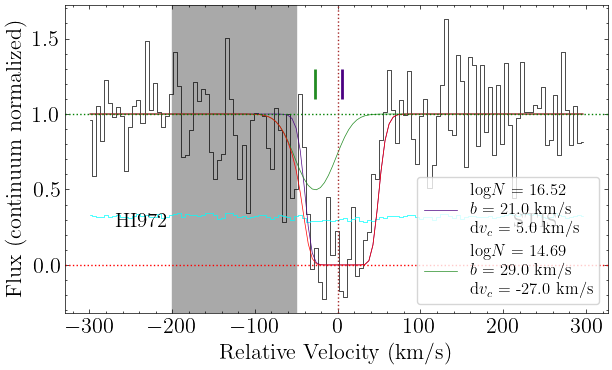

In [42]:
fig, ax = hi_972_stis.plot_ion_transition_init_fit()

In [43]:
hi_972_stis.fit_ion_transition()

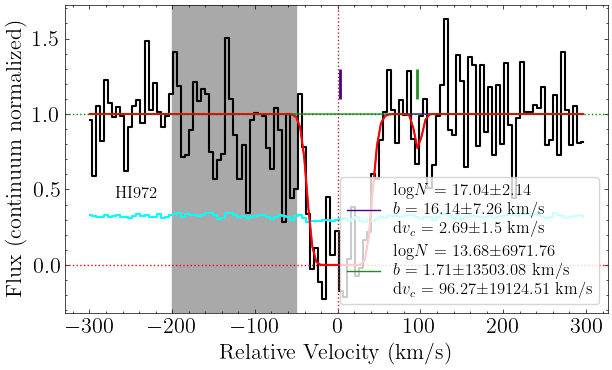

In [44]:
fig, ax = hi_972_stis.plot_ion_transition_best_fit()

## HI 949 (STIS)

In [45]:
hi_949_stis = ion_transition('HI', 949, 'H', z_sys, 'STIS')

In [46]:
hi_949_stis.grab_ion_transition_info()

In [47]:
hi_949_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-80,-40],[40,100]])

In [48]:
hi_949_stis.cont_norm_flux(renorm=True, v_abs_range=[-80,100], degree=1)

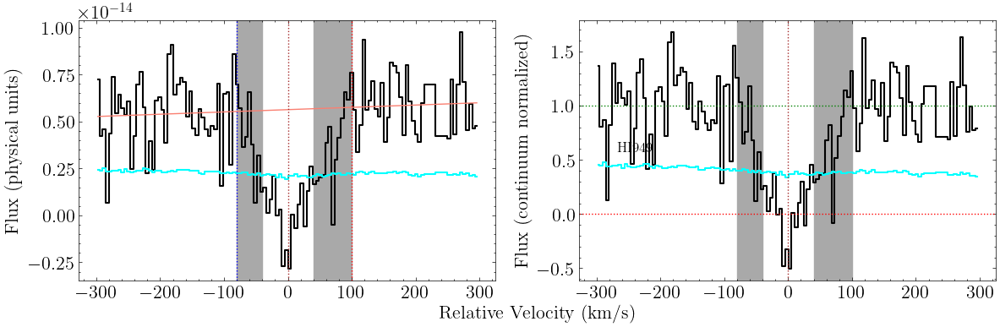

In [49]:
fig, axes = hi_949_stis.plot_ion_transition_spec_cont()

In [50]:
hi_949_stis.get_EW_total(-80,100)

Integration window: [-80, 100]
EW, 1sig: 352, 36
EW-3sig: 106.729


In [51]:
hi_949_stis.grab_ion_transition_lsf(lsf_fits_list)

In [52]:
hi_949_stis.init_ion_transition(init_values = np.array([[16.52,21, 5],[14.69,29,-27]]), 
                             lsf_convolve = True)

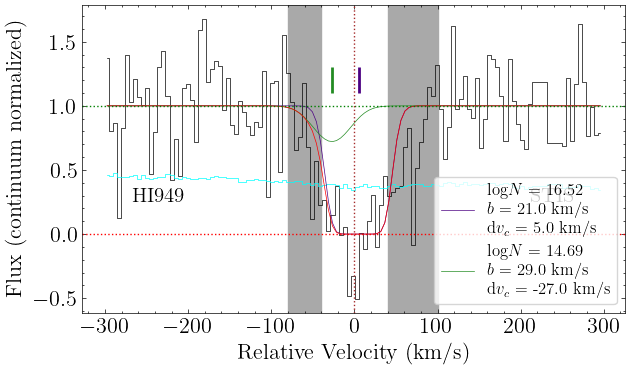

In [53]:
fig, ax = hi_949_stis.plot_ion_transition_init_fit()

In [54]:
hi_949_stis.fit_ion_transition()

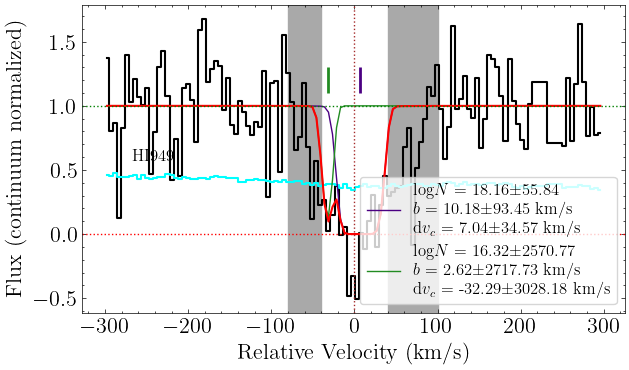

In [55]:
fig, ax = hi_949_stis.plot_ion_transition_best_fit()

## HI 937 (STIS)

In [56]:
hi_937_stis = ion_transition('HI', 937, 'H', z_sys, 'STIS')

In [57]:
hi_937_stis.grab_ion_transition_info()

In [58]:
hi_937_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-80,-40],[50,100]])

In [59]:
hi_937_stis.cont_norm_flux(renorm=True, v_abs_range=[-100,105], degree=1)

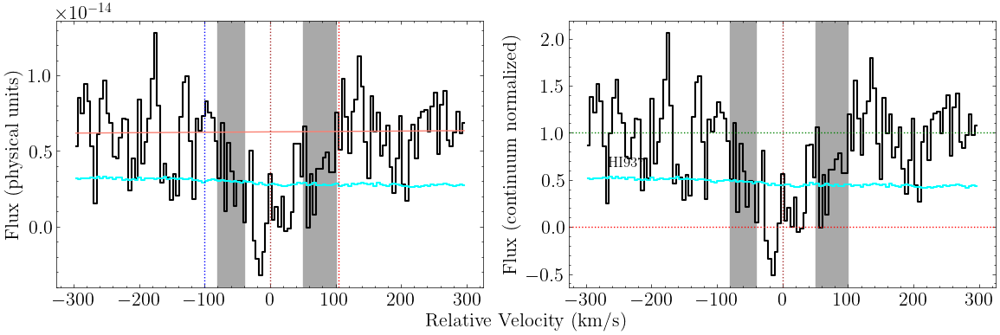

In [60]:
fig, axes = hi_937_stis.plot_ion_transition_spec_cont()

In [61]:
hi_937_stis.get_EW_total(-100,105)

Integration window: [-100, 105]
EW, 1sig: 346, 45
EW-3sig: 133.906


In [62]:
hi_937_stis.grab_ion_transition_lsf(lsf_fits_list)

In [63]:
hi_937_stis.init_ion_transition(init_values = np.array([[16.52,21, 5],[14.69,29,-27]]), 
                             lsf_convolve = True)

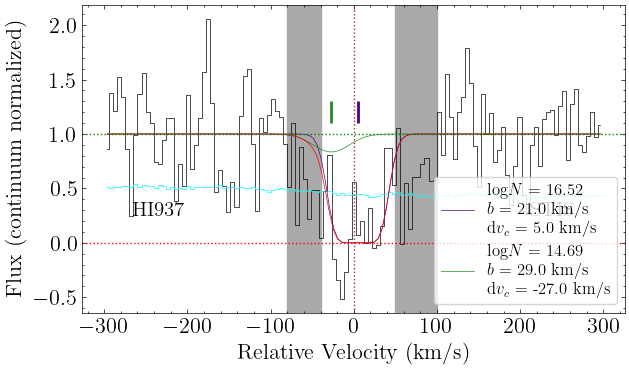

In [64]:
fig, ax = hi_937_stis.plot_ion_transition_init_fit()

In [65]:
hi_937_stis.fit_ion_transition()

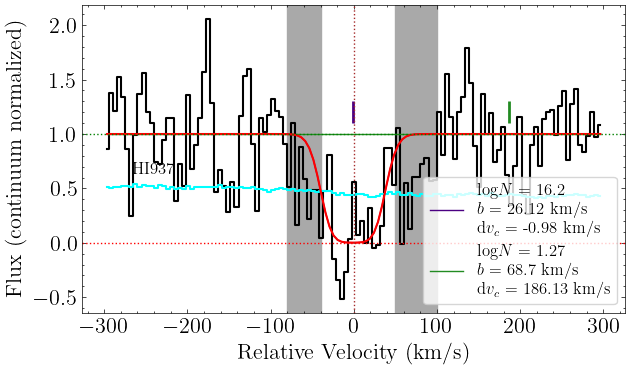

In [66]:
fig, ax = hi_937_stis.plot_ion_transition_best_fit()

## HI 930 (NUV)

In [67]:
hi_930_nuv = ion_transition('HI', 930, 'H', z_sys, 'COS NUV')

In [68]:
hi_930_nuv.grab_ion_transition_info(delta_v=-7.5)

In [69]:
hi_930_nuv.grab_ion_transition_spec(spec_fits_list)

In [70]:
hi_930_nuv.cont_norm_flux(renorm=True, v_abs_range=[-100,90], degree=1)

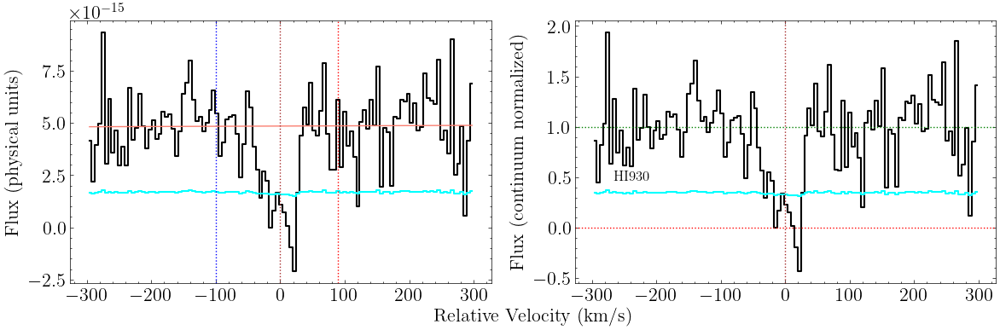

In [71]:
fig, axes = hi_930_nuv.plot_ion_transition_spec_cont()

In [72]:
hi_930_nuv.wav0_rest, hi_930_nuv.cont_params

(930.7483, [4.849600183452676e-15, 1.1094380494869676e-19])

In [73]:
hi_930_nuv.get_EW_total(-100,90)

Integration window: [-100, 90]
EW, 1sig: 174, 33
EW-3sig: 99.217


In [74]:
hi_930_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [75]:
hi_930_nuv.init_ion_transition(init_values = np.array([[16.52,21, 0],[14.69,29,-25]]), 
                             lsf_convolve = True)

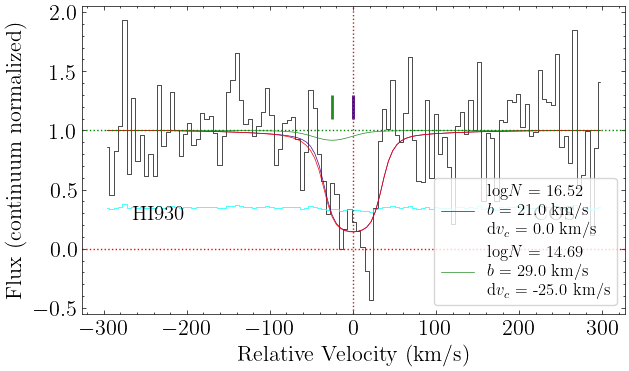

In [76]:
fig, ax = hi_930_nuv.plot_ion_transition_init_fit()

In [77]:
hi_930_nuv.fit_ion_transition()

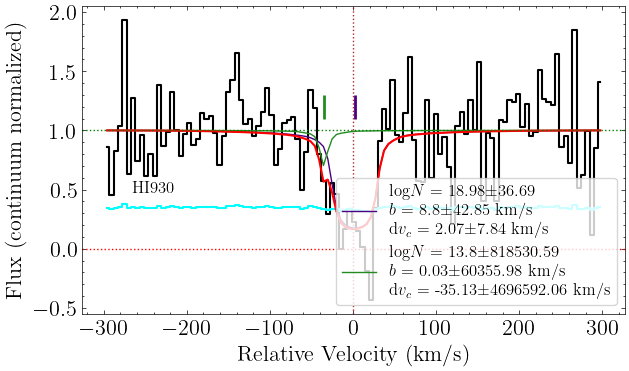

In [78]:
fig, ax = hi_930_nuv.plot_ion_transition_best_fit()

## HI 926 (NUV)

In [79]:
hi_926_nuv = ion_transition('HI', 926, 'H', z_sys, 'COS NUV')

In [80]:
hi_926_nuv.grab_ion_transition_info()

In [81]:
hi_926_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[100,300]])

In [82]:
hi_926_nuv.cont_norm_flux(renorm=True, v_abs_range=[-50,50], degree=1)

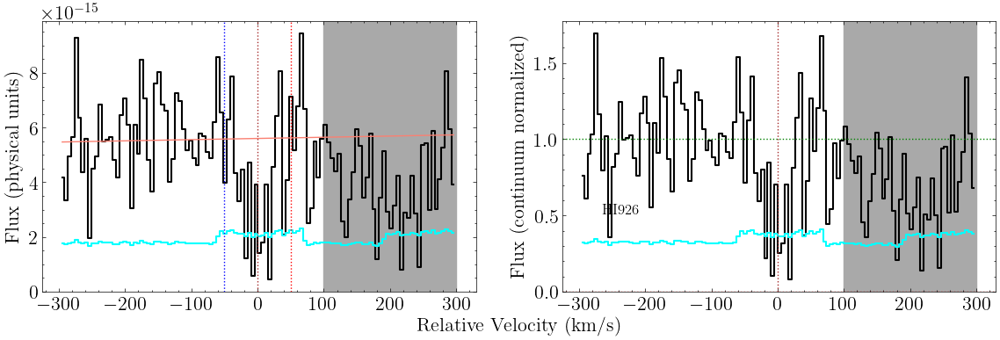

In [83]:
fig, axes = hi_926_nuv.plot_ion_transition_spec_cont()

In [84]:
hi_926_nuv.wav0_rest, hi_926_nuv.cont_params

(926.2257, [5.603106972956666e-15, 4.378465560504285e-19])

In [85]:
hi_926_nuv.get_EW_total(-100,90)

Integration window: [-100, 90]
EW, 1sig: 85, 35
EW-3sig: 104.342


In [86]:
hi_926_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [87]:
hi_926_nuv.init_ion_transition(init_values = np.array([[16.52,21, 0]]), 
                             lsf_convolve = True)

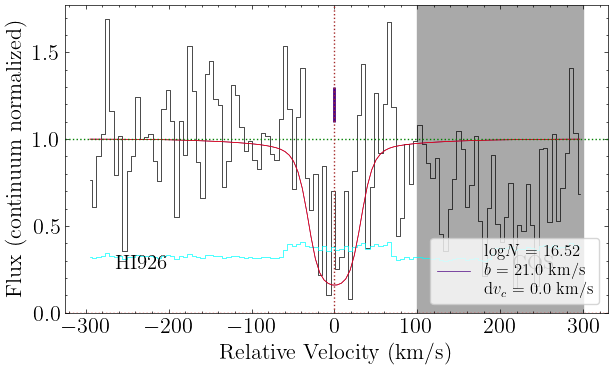

In [88]:
fig, ax = hi_926_nuv.plot_ion_transition_init_fit()

In [89]:
hi_926_nuv.fit_ion_transition()

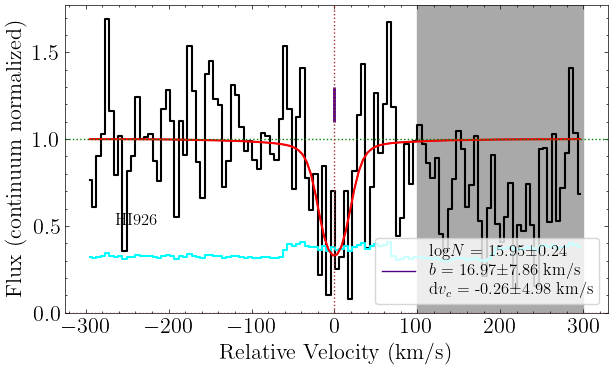

In [90]:
fig, ax = hi_926_nuv.plot_ion_transition_best_fit()

## HI 923 (NUV)

In [91]:
hi_923_nuv = ion_transition('HI', 923, 'H', z_sys, 'COS NUV')

In [92]:
hi_923_nuv.grab_ion_transition_info()

In [93]:
hi_923_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-140],[160,300]])

In [94]:
hi_923_nuv.cont_norm_flux(renorm=True, v_abs_range=[-50,50], degree=1)

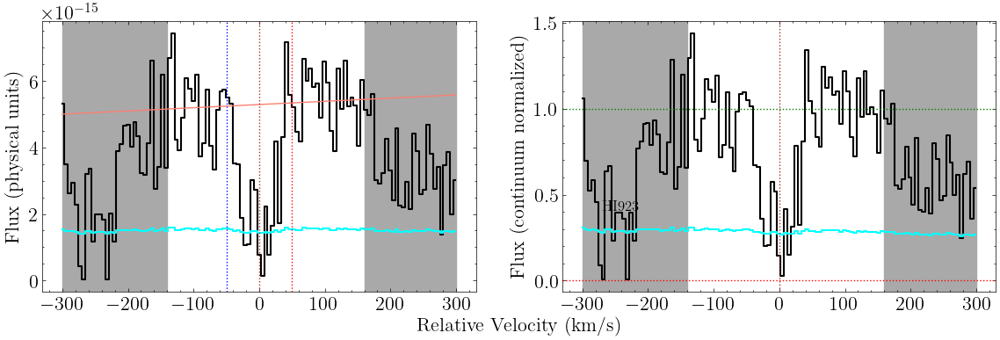

In [95]:
fig, axes = hi_923_nuv.plot_ion_transition_spec_cont()

In [96]:
hi_923_nuv.wav0_rest, hi_923_nuv.cont_params

(923.1504, [5.292233075109496e-15, 9.65069545934229e-19])

## HI 921 (NUV)

In [97]:
hi_921_nuv = ion_transition('HI', 921, 'H', z_sys, 'COS NUV')

In [98]:
hi_921_nuv.grab_ion_transition_info()

In [99]:
hi_921_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[-200,-160], [220,300]])

In [100]:
hi_921_nuv.cont_norm_flux(renorm=True, v_abs_range=[-50,120], degree=1)

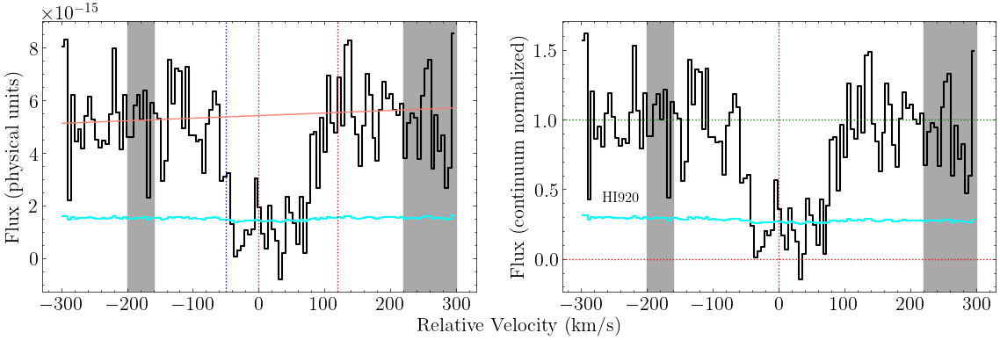

In [101]:
fig, axes = hi_921_nuv.plot_ion_transition_spec_cont()

In [102]:
hi_921_nuv.wav0_rest, hi_921_nuv.cont_params

(920.9631, [5.424312680213571e-15, 9.83777845060547e-19])

## HI 919 (NUV)

In [103]:
hi_919_nuv = ion_transition('HI', 919, 'H', z_sys, 'COS NUV')

In [104]:
hi_919_nuv.grab_ion_transition_info()

In [105]:
hi_919_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[-200,-160], [20,100], [220,300]])

In [106]:
hi_919_nuv.cont_norm_flux(renorm=True, v_abs_range=[-100,100], degree=1)

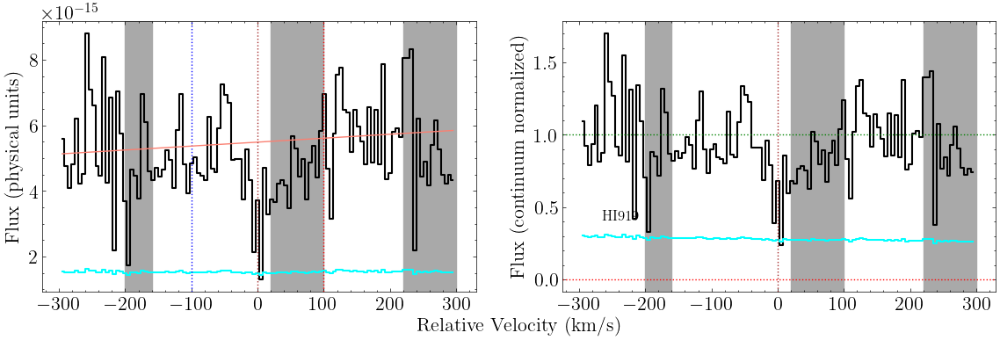

In [107]:
fig, axes = hi_919_nuv.plot_ion_transition_spec_cont()

In [108]:
hi_919_nuv.get_EW_total(-100,90)

Integration window: [-100, 90]
EW, 1sig: 88, 26
EW-3sig: 79.464


In [109]:
hi_919_nuv.wav0_rest, hi_919_nuv.cont_params

(919.3514, [5.49092946482768e-15, 1.2048755878241267e-18])

In [110]:
hi_919_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [111]:
hi_919_nuv.init_ion_transition(init_values = np.array([[16.8,24, 0]]), 
                             lsf_convolve = True)

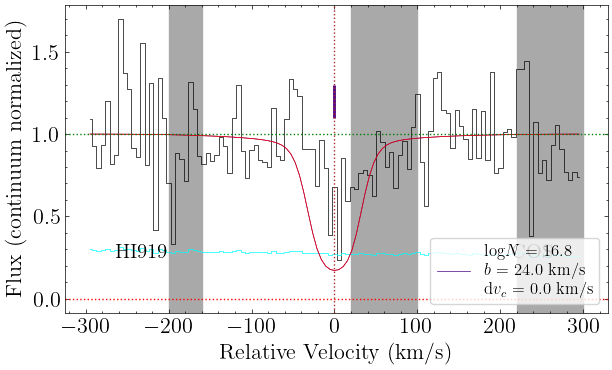

In [112]:
fig, ax = hi_919_nuv.plot_ion_transition_init_fit()

In [113]:
hi_919_nuv.fit_ion_transition(fix_params_list = ['it1c1_dv_c'])

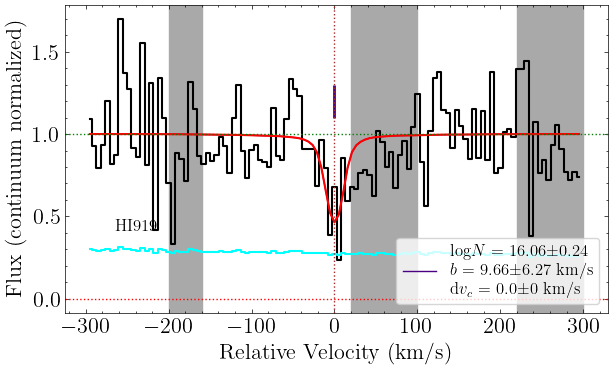

In [114]:
fig, ax = hi_919_nuv.plot_ion_transition_best_fit()

## HI 918 (NUV)

In [115]:
hi_918_nuv = ion_transition('HI', 918, 'H', z_sys, 'COS NUV')

In [116]:
hi_918_nuv.grab_ion_transition_info()

In [117]:
hi_918_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[-100,-40]])

In [118]:
hi_918_nuv.cont_norm_flux(renorm=True, v_abs_range=[-100,90], degree=1)

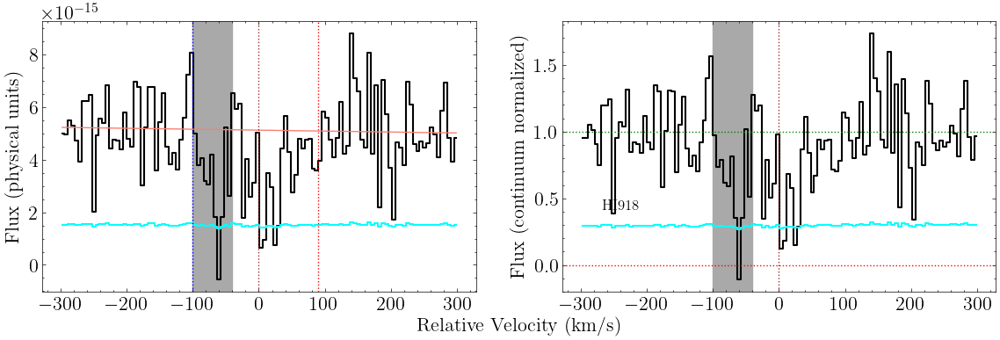

In [119]:
fig, axes = hi_918_nuv.plot_ion_transition_spec_cont()

In [120]:
hi_918_nuv.wav0_rest, hi_918_nuv.cont_params

(918.1294, [5.125704709379066e-15, -3.556080877209586e-19])

In [121]:
hi_918_nuv.get_EW_total(-100,90)

Integration window: [-100, 90]
EW, 1sig: 179, 28
EW-3sig: 83.336


In [122]:
hi_918_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [123]:
hi_918_nuv.init_ion_transition(init_values = np.array([[16.52,21, 5],[14.69,29,-27]]), 
                             lsf_convolve = True)

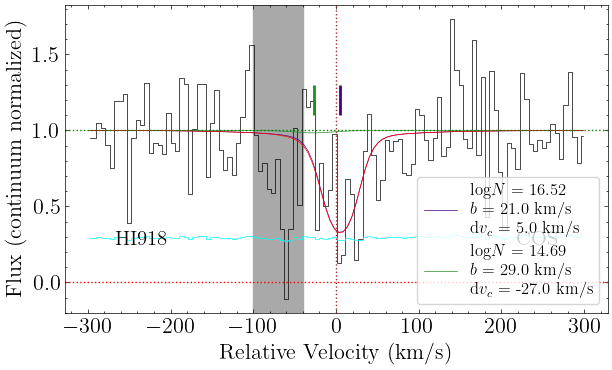

In [124]:
fig, ax = hi_918_nuv.plot_ion_transition_init_fit()

In [125]:
hi_918_nuv.fit_ion_transition()

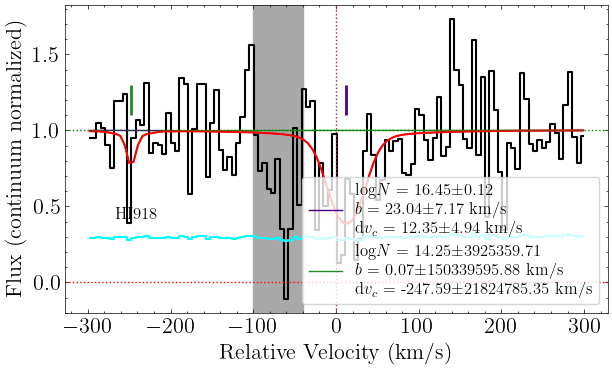

In [126]:
fig, ax = hi_918_nuv.plot_ion_transition_best_fit()

## HI 917 (NUV)

In [127]:
hi_917_nuv = ion_transition('HI', 917, 'H', z_sys, 'COS NUV')

In [128]:
hi_917_nuv.grab_ion_transition_info(delta_v=-6)

In [129]:
hi_917_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[-200,-100],[200,300]])

In [130]:
hi_917_nuv.cont_norm_flux(renorm=True, v_abs_range=[-50,80], degree=1)

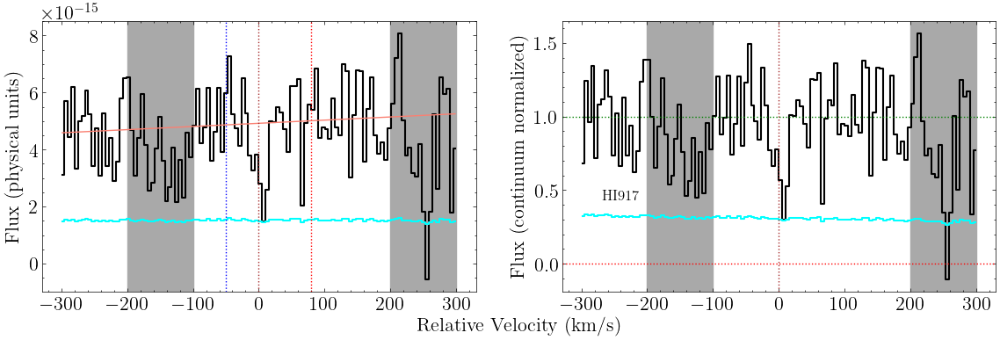

In [131]:
fig, axes = hi_917_nuv.plot_ion_transition_spec_cont()

In [132]:
hi_917_nuv.wav0_rest, hi_917_nuv.cont_params

(917.1806, [4.92171401309442e-15, 1.1125868470686737e-18])

In [133]:
hi_917_nuv.get_EW_total(-50,50)

Integration window: [-50, 50]
EW, 1sig: 24, 21
EW-3sig: 61.665


In [134]:
hi_917_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [135]:
hi_917_nuv.init_ion_transition(init_values = np.array([[16.52,10, 0]]), 
                             lsf_convolve = True)

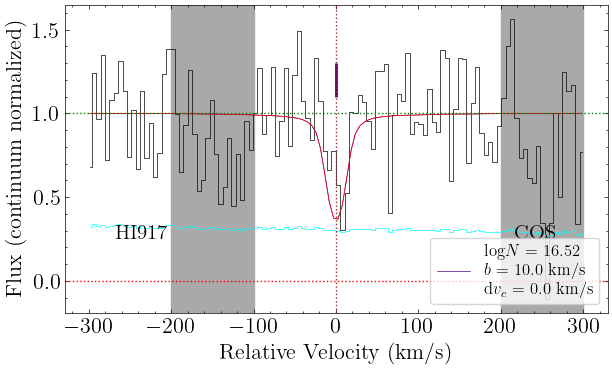

In [136]:
fig, ax = hi_917_nuv.plot_ion_transition_init_fit()

In [137]:
hi_917_nuv.fit_ion_transition(fix_params_list = ['it1c1_dv_c'])

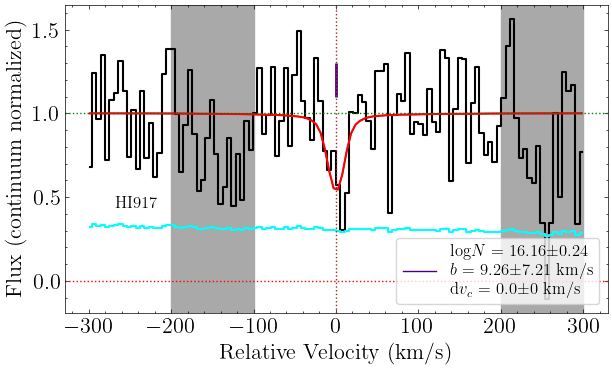

In [138]:
fig, ax = hi_917_nuv.plot_ion_transition_best_fit()

## HI 916.4 (NUV)

In [139]:
hi_916_4_nuv = ion_transition('HI', 916.4, 'H', z_sys, 'COS NUV')

In [140]:
hi_916_4_nuv.grab_ion_transition_info()

In [141]:
hi_916_4_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-200], [50,140], [200,300]])

In [142]:
hi_916_4_nuv.cont_norm_flux(renorm=True, v_abs_range=[-120,50], degree=1)

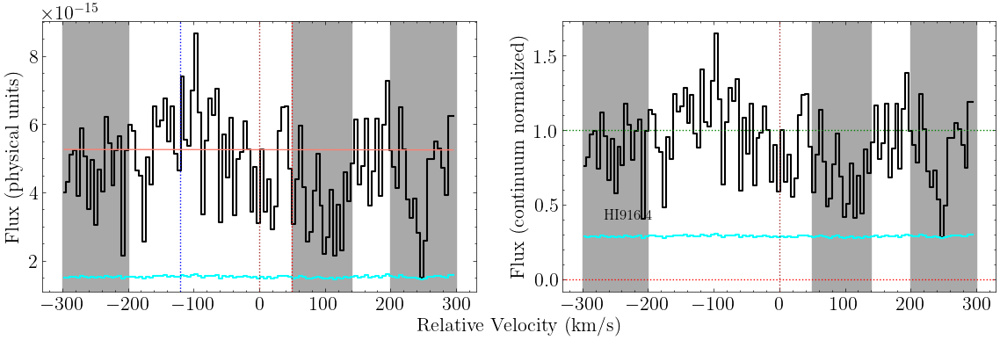

In [143]:
fig, axes = hi_916_4_nuv.plot_ion_transition_spec_cont()

In [144]:
hi_916_4_nuv.wav0_rest, hi_916_4_nuv.cont_params

(916.429, [5.251488871115521e-15, -2.2299953314894227e-20])

## HI 915.8 (NUV)

In [145]:
hi_915_8_nuv = ion_transition('HI', 915.8, 'H', z_sys, 'COS NUV')

In [146]:
hi_915_8_nuv.grab_ion_transition_info()

In [147]:
hi_915_8_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-200], [120,300]])

In [148]:
hi_915_8_nuv.cont_norm_flux(renorm=True, v_abs_range=[-140,80], degree=1)

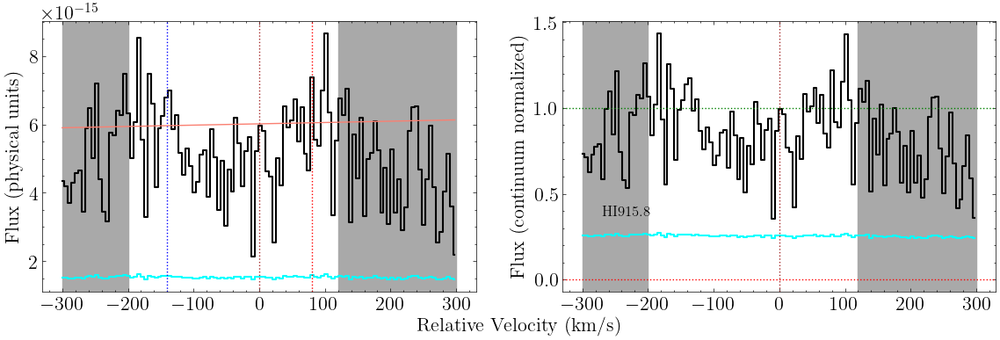

In [149]:
fig, axes = hi_915_8_nuv.plot_ion_transition_spec_cont()

In [150]:
hi_915_8_nuv.wav0_rest, hi_915_8_nuv.cont_params

(915.824, [6.017739841721706e-15, 3.8444281037086417e-19])

## HI ion - higher order

In [151]:
hi_hi = ion(z_sys, 'HI_hi', [hi_930_nuv, hi_926_nuv, hi_919_nuv, hi_917_nuv])

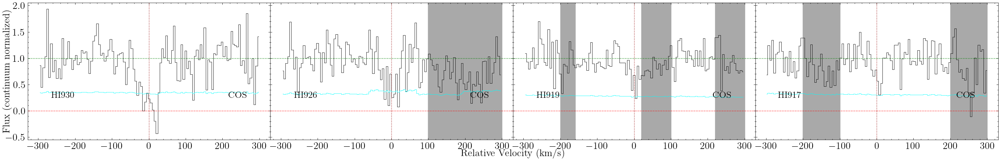

In [152]:
fig, axes = hi_hi.plot_ion(n_cols=4)

In [153]:
hi_hi.init_ion([[[16.2, 15, 0]],
                [[16.2, 15, 0]],
                [[16.2, 15, 0]],
                [[16.2, 15, 0]],])

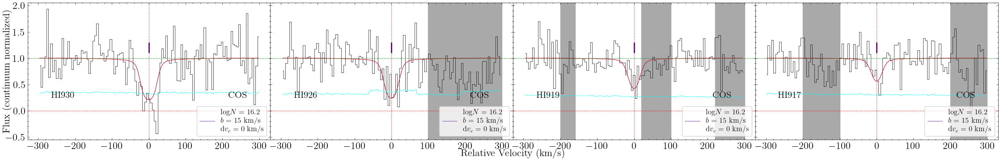

In [154]:
fig, axes = hi_hi.plot_ion_init_fit(n_cols=4)

In [155]:
hi_hi.fit_ion(tie_params_list=[['it1c1_logN', 'it2c1_logN'], # Tie logN for c1
                            ['it1c1_logN', 'it3c1_logN'],
                            ['it1c1_logN', 'it4c1_logN'],
                            ['it1c1_b', 'it2c1_b'], # Tie b for c1
                            ['it1c1_b', 'it3c1_b'],
                            ['it1c1_b', 'it4c1_b'],
                            ['it1c1_dv_c', 'it2c1_dv_c'], # Tie dv_c for c1
                            ['it1c1_dv_c', 'it3c1_dv_c'], 
                            ['it1c1_dv_c', 'it4c1_dv_c'],
                           ],
            fix_params_list = ['it1c1_dv_c'],
            lower_bounds_dict = {'it1c1_b':8},
          )

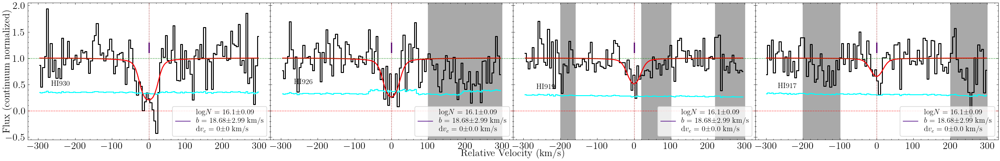

In [156]:
fig, axes = hi_hi.plot_ion_best_fit(n_cols=4)

In [157]:
#hi_hi.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-16, n_walkers=100, n_steps=2000)
#hi_hi.fit_ion_emcee(load=True, loaddir=rootdir)

In [158]:
#fig, axes = hi_hi.plot_samples(n_cols=4)

In [159]:
#hi_hi.plot_corner()

## HI ion

In [160]:
hi = ion(z_sys, 'HI', [hi_1215_stis, hi_1025_stis, hi_972_stis, hi_930_nuv, hi_926_nuv, hi_919_nuv, hi_917_nuv])

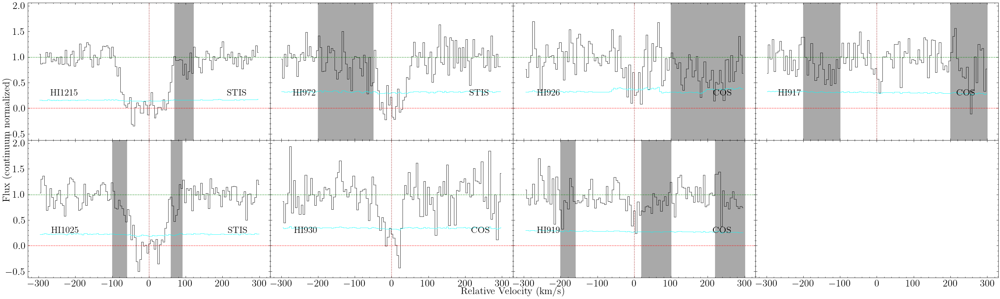

In [161]:
fig, axes = hi.plot_ion(n_cols=4)

In [162]:
hi.init_ion([[[16.2, 15, 0],[14.7,30,-25], [14.5,17,30]],
            [[16.2, 15, 0],[14.7,30,-25], [14.5,17,30]],
            [[16.2, 15, 0],[14.7,30,-25], [14.5,17,30]],
            [[16.2, 15, 0],[14.7,30,-25], [14.5,17,30]],
            [[16.2, 15, 0],[14.7,30,-25], [14.5,17,30]],
            [[16.2, 15, 0],[14.7,30,-25], [14.5,17,30]],
            [[16.2, 15, 0],[14.7,30,-25], [14.5,17,30]],
            [[16.2, 15, 0],[14.7,30,-25], [14.5,17,30]]])

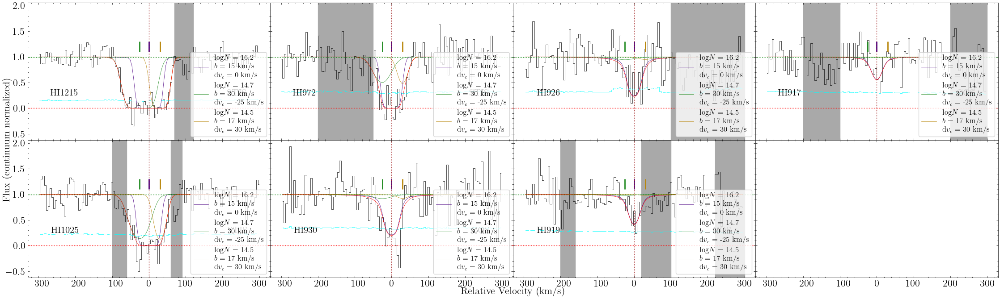

In [163]:
fig, axes = hi.plot_ion_init_fit(n_cols=4)

In [164]:
hi.fit_ion(tie_params_list=[['it1c1_logN', 'it2c1_logN'], # Tie logN for c1
                            ['it1c1_logN', 'it3c1_logN'],
                            ['it1c1_logN', 'it4c1_logN'],
                            ['it1c1_logN', 'it5c1_logN'],
                            ['it1c1_logN', 'it6c1_logN'],
                            ['it1c1_logN', 'it7c1_logN'],
                            ['it1c1_b', 'it2c1_b'], # Tie b for c1
                            ['it1c1_b', 'it3c1_b'],
                            ['it1c1_b', 'it4c1_b'],
                            ['it1c1_b', 'it5c1_b'],
                            ['it1c1_b', 'it6c1_b'],
                            ['it1c1_b', 'it7c1_b'],
                            ['it1c1_dv_c', 'it2c1_dv_c'], # Tie dv_c for c1
                            ['it1c1_dv_c', 'it3c1_dv_c'], 
                            ['it1c1_dv_c', 'it4c1_dv_c'],
                            ['it1c1_dv_c', 'it5c1_dv_c'],
                            ['it1c1_dv_c', 'it6c1_dv_c'],
                            ['it1c1_dv_c', 'it7c1_dv_c'],
                            ['it1c2_logN', 'it2c2_logN'], # Tie logN for c2
                            ['it1c2_logN', 'it3c2_logN'],
                            ['it1c2_logN', 'it4c2_logN'],
                            ['it1c2_logN', 'it5c2_logN'],
                            ['it1c2_logN', 'it6c2_logN'],
                            ['it1c2_logN', 'it7c2_logN'],
                            ['it1c2_b', 'it2c2_b'], # Tie b for c2
                            ['it1c2_b', 'it3c2_b'],
                            ['it1c2_b', 'it4c2_b'],
                            ['it1c2_b', 'it5c2_b'],
                            ['it1c2_b', 'it6c2_b'],
                            ['it1c2_b', 'it7c2_b'],
                            ['it1c2_dv_c', 'it2c2_dv_c'], # Tie dv_c for c2
                            ['it1c2_dv_c', 'it3c2_dv_c'],
                            ['it1c2_dv_c', 'it4c2_dv_c'],
                            ['it1c2_dv_c', 'it5c2_dv_c'],
                            ['it1c2_dv_c', 'it6c2_dv_c'],
                            ['it1c2_dv_c', 'it7c2_dv_c'],
                            ['it1c3_logN', 'it2c3_logN'], # Tie logN for c3
                            ['it1c3_logN', 'it3c3_logN'],
                            ['it1c3_logN', 'it4c3_logN'],
                            ['it1c3_logN', 'it5c3_logN'],
                            ['it1c3_logN', 'it6c3_logN'],
                            ['it1c3_logN', 'it7c3_logN'],
                            ['it1c3_b', 'it2c3_b'], # Tie b for c3
                            ['it1c3_b', 'it3c3_b'],
                            ['it1c3_b', 'it4c3_b'],
                            ['it1c3_b', 'it5c3_b'],
                            ['it1c3_b', 'it6c3_b'],
                            ['it1c3_b', 'it7c3_b'],
                            ['it1c3_dv_c', 'it2c3_dv_c'], # Tie dv_c for c3
                            ['it1c3_dv_c', 'it3c3_dv_c'],
                            ['it1c3_dv_c', 'it4c3_dv_c'],
                            ['it1c3_dv_c', 'it5c3_dv_c'],
                            ['it1c3_dv_c', 'it6c3_dv_c'],
                            ['it1c3_dv_c', 'it7c3_dv_c'],
                           ],
            fix_params_list = ['it1c1_dv_c', 'it1c2_dv_c'],
            exclude_models = ['it1c1_b > it1c3_b', # Make c1 narrow
                              'it1c3_b > it1c2_b', # c2 is broadest
                              'it1c3_logN > it1c2_logN'],
            lower_bounds_dict = {'it1c1_b':8, 'it1c3_dv_c':6},
            upper_bounds_dict = {'it1c3_dv_c':60}
          )
            #upper_bounds_dict = {'it1c1_logN': 17})

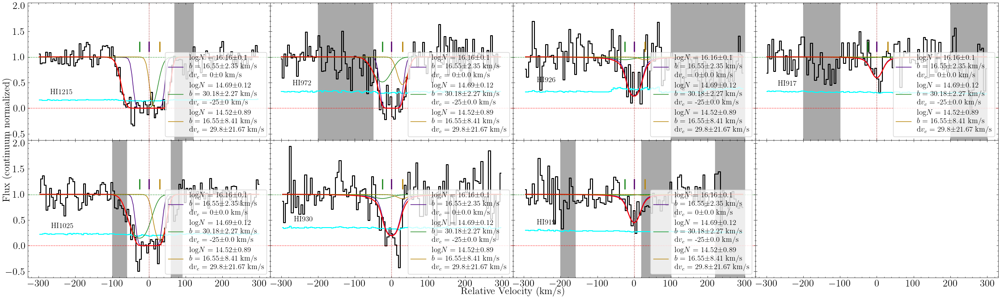

In [165]:
fig, axes = hi.plot_ion_best_fit(n_cols=4)

In [166]:
#hi.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-16, n_walkers=100, n_steps=2000)
#hi.fit_ion_emcee(load=True, loaddir=rootdir)

In [167]:
#fig, axes = hi.plot_samples(n_cols=4)

In [168]:
#hi.plot_corner()

# HeI

## HeI 584

In [169]:
hei_584_fuv = ion_transition('HeI', 584, 'He', z_sys, 'COS FUV')

In [170]:
hei_584_fuv.grab_ion_transition_info(delta_v=1)

In [171]:
hei_584_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-140], [-95,-30]])

In [172]:
hei_584_fuv.cont_norm_flux(v_abs_range=[-75,50], degree=1)

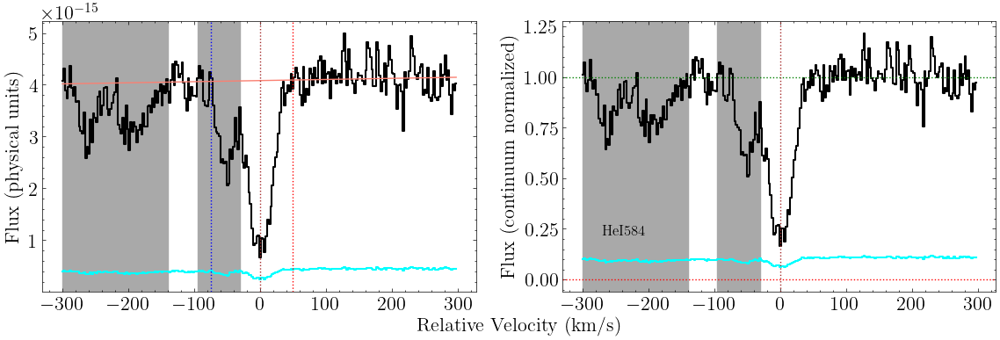

In [173]:
fig, ax = hei_584_fuv.plot_ion_transition_spec_cont()
#ax[0].axvline(-95)

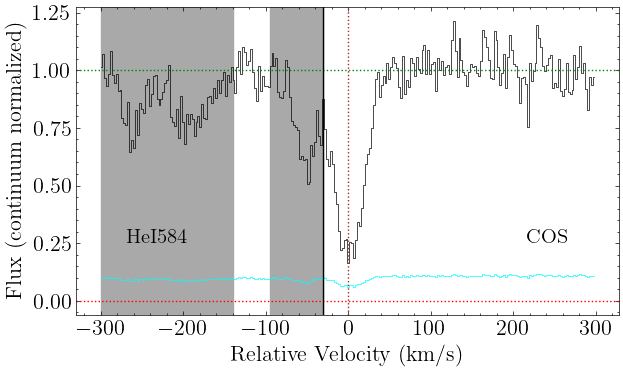

In [174]:
fig, ax = hei_584_fuv.plot_ion_transition_spec()
ax.axvline(-30)

In [175]:
hei_584_fuv.get_EW_total(-50,50)

Integration window: [-50, 50]
EW, 1sig: 81, 3
EW-3sig: 7.836


In [176]:
hei_584_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [177]:
hei_584_fuv.init_ion_transition(init_values = np.array([[14.48, 14, 0]]), 
                             lsf_convolve = True)

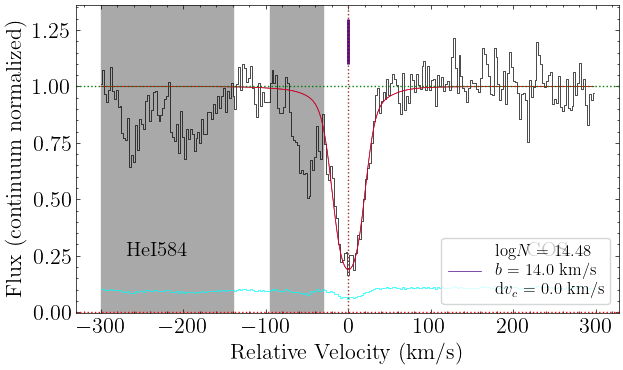

In [178]:
fig, ax = hei_584_fuv.plot_ion_transition_init_fit()

In [179]:
hei_584_fuv.fit_ion_transition()

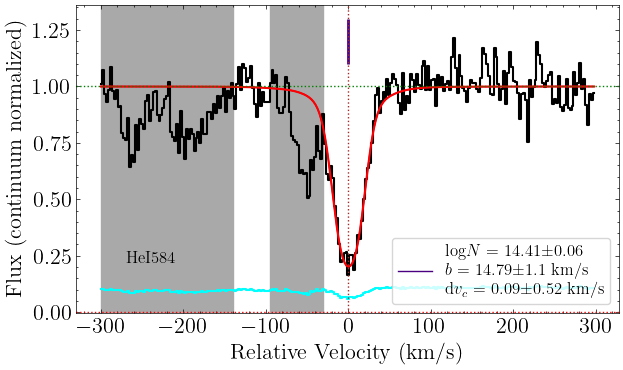

In [180]:
fig, ax = hei_584_fuv.plot_ion_transition_best_fit()

## HeI 537

In [181]:
hei_537_fuv = ion_transition('HeI', 537, 'He', z_sys, 'COS FUV')

In [182]:
hei_537_fuv.grab_ion_transition_info(delta_v=10.3)

In [183]:
hei_537_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-190]])

In [184]:
hei_537_fuv.cont_norm_flux(v_abs_range=[-40,50], degree=1)

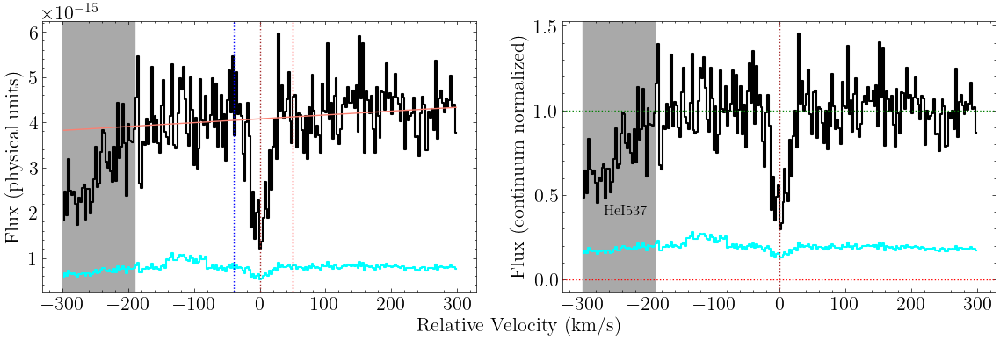

In [185]:
fig, ax = hei_537_fuv.plot_ion_transition_spec_cont()

In [186]:
hei_584_fuv.get_EW_total(-40,50)

Integration window: [-40, 50]
EW, 1sig: 73, 2
EW-3sig: 7.469


In [187]:
hei_537_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [188]:
hei_537_fuv.init_ion_transition(init_values = np.array([[14.48, 14, 9]]), 
                             lsf_convolve = True)

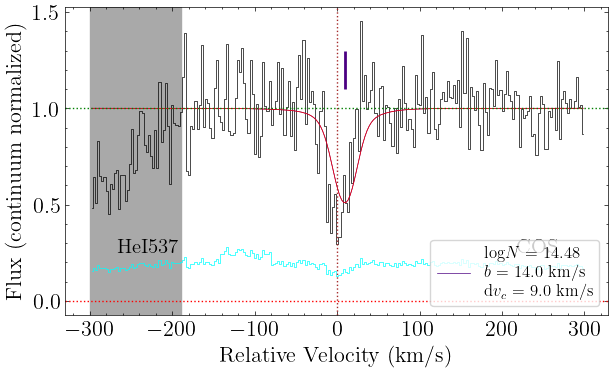

In [189]:
fig, ax = hei_537_fuv.plot_ion_transition_init_fit()

In [190]:
hei_537_fuv.fit_ion_transition()

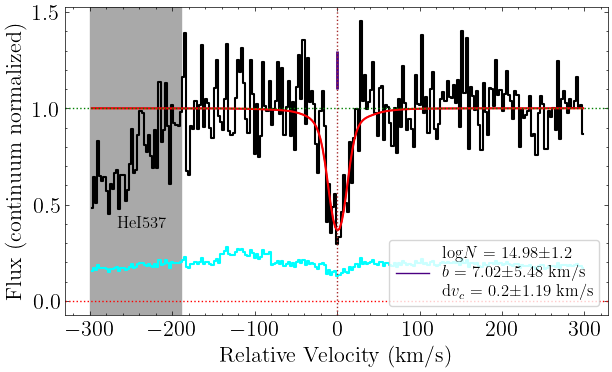

In [191]:
fig, ax = hei_537_fuv.plot_ion_transition_best_fit()

## HeI ion

In [192]:
hei = ion(z_sys, 'HeI', [hei_584_fuv, hei_537_fuv])

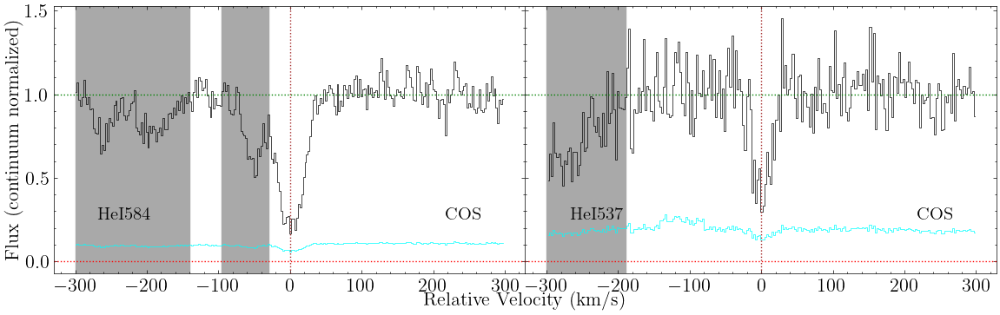

In [193]:
fig, axes = hei.plot_ion()

In [194]:
hei.init_ion([[[14.4, 15, 0]], 
              [[14.4, 15, 0]]])
#oiii.init_ion(np.array([[14.19, 17.10, -0.56]]))

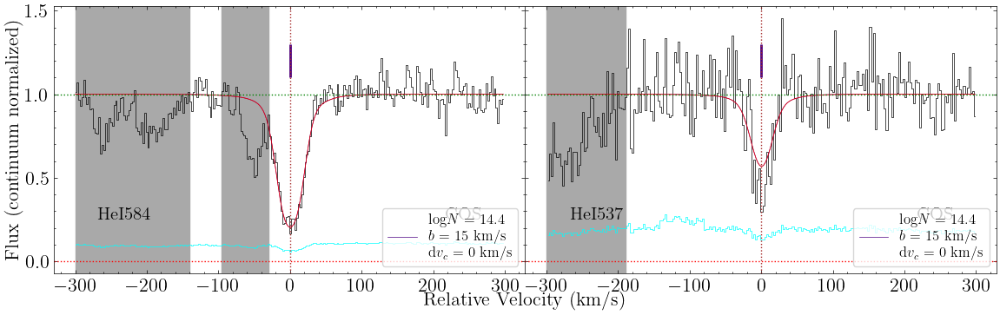

In [195]:
fig, axes = hei.plot_ion_init_fit()

In [196]:
#hei.fit_ion()

hei.fit_ion(tie_params_list=[['it1c1_logN', 'it2c1_logN'],
                             ['it1c1_b', 'it2c1_b'],
                             ['it1c1_dv_c', 'it2c1_dv_c']],
           fix_params_list = ['it1c1_dv_c'])

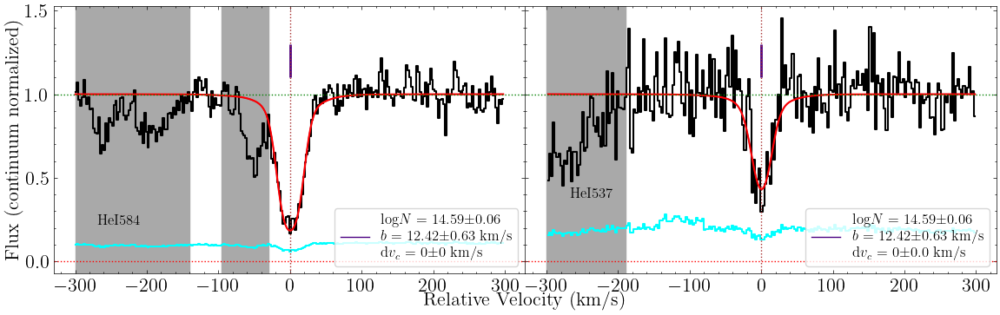

In [197]:
fig, axes = hei.plot_ion_best_fit()

In [198]:
#hei.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-6, n_walkers=100, n_steps=2500)
#hei.fit_ion_emcee(load=True, loaddir=rootdir)

In [199]:
#fig, axes = hei.plot_samples()

In [200]:
#hei.plot_corner()

# CIII

## CIII 977 (STIS)

Grab CIII 977 from STIS

In [201]:
ciii_977_stis = ion_transition('CIII', 977, 'C', z_sys, 'STIS')

In [202]:
ciii_977_stis.grab_ion_transition_info(delta_v=6)

In [203]:
ciii_977_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-70,-20],[25,80]])

In [204]:
ciii_977_stis.cont_norm_flux(v_abs_range=[-100,100], degree=1)

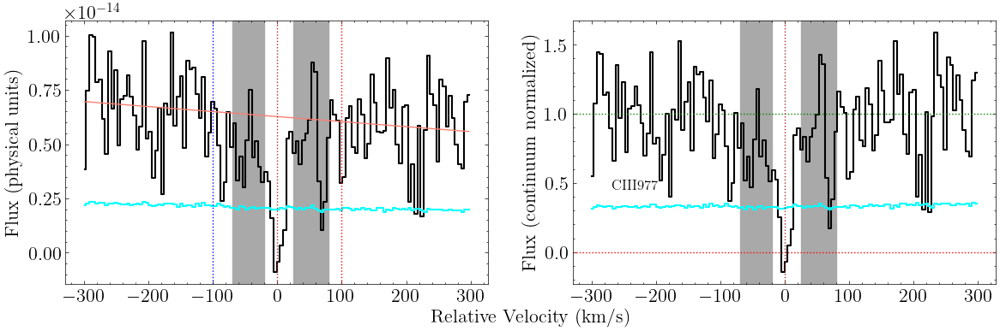

In [205]:
fig, ax = ciii_977_stis.plot_ion_transition_spec_cont()

In [206]:
ciii_977_stis.get_EW_total(-60,60)

Integration window: [-60, 60]
EW, 1sig: 138, 25
EW-3sig: 76.057


In [207]:
ciii_977_stis.grab_ion_transition_lsf(lsf_fits_list)

In [208]:
ciii_977_stis.init_ion_transition(init_values = np.array([[13.8, 7, 0]]), 
                             lsf_convolve = True)

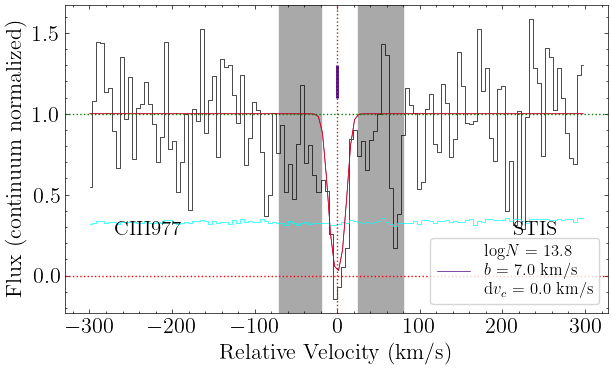

In [209]:
fig, ax = ciii_977_stis.plot_ion_transition_init_fit()

In [210]:
ciii_977_stis.fit_ion_transition()

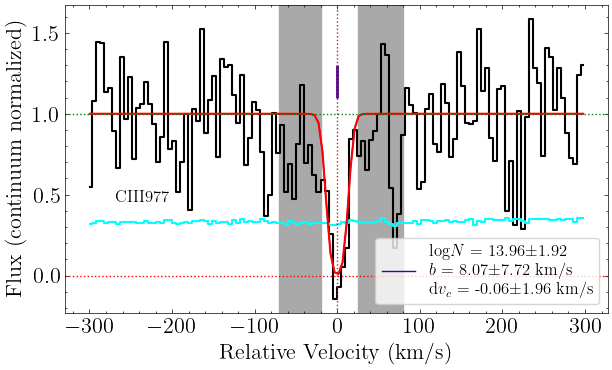

In [211]:
fig, ax = ciii_977_stis.plot_ion_transition_best_fit()

## CIII ion

In [212]:
ciii = ion(z_sys, 'CIII', [ciii_977_stis])

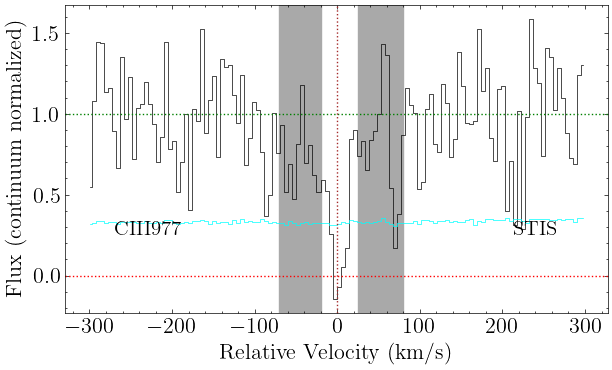

In [213]:
fig, axes = ciii.plot_ion()

In [214]:
ciii.init_ion([[[13.6, 12, 0]]])
#ciii.init_ion(np.array([[13.57, 17.10, -0.91]]))

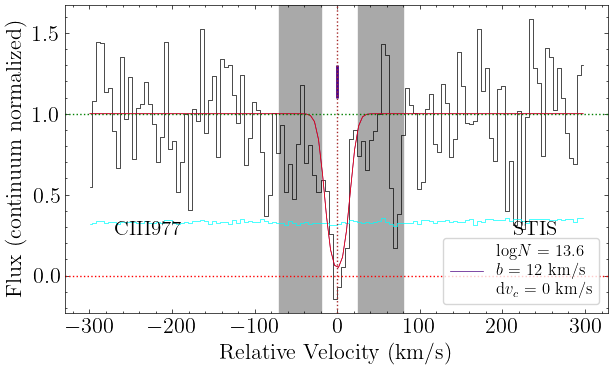

In [215]:
fig, axes = ciii.plot_ion_init_fit()

In [216]:
ciii.fit_ion(fix_params_list=['it1c1_dv_c', 'it1c1_b'],
             #lower_bounds_dict={'it1c1_b':3.7},
             upper_bounds_dict={'it1c1_logN':15,})
             #                  'it1c1_b':12})

#ciii.fit_ion(lower_bounds_dict={'it1c1_logN':13., 'it1c1_b':5., 'it1c1_dv_c':-40}, 
#             upper_bounds_dict={'it1c1_logN':15., 'it1c1_b':60., 'it1c1_dv_c':40})

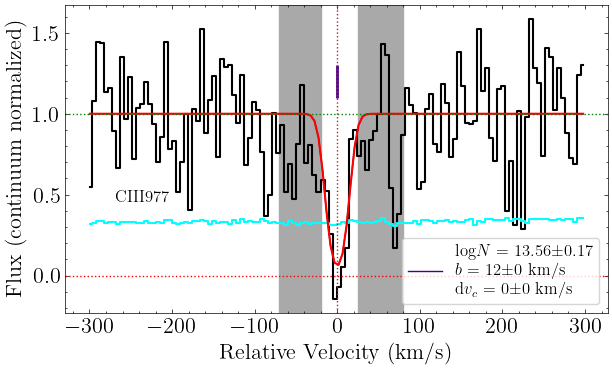

In [217]:
fig, axes = ciii.plot_ion_best_fit()

In [218]:
#ciii.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-16, n_walkers=200, n_steps=2000)
#ciii.fit_ion_emcee(load=True, loaddir=rootdir)

In [219]:
#fig, axes = ciii.plot_samples()

In [220]:
#ciii.plot_corner()

In [221]:
#np.percentile(ciii.result_emcee.flatchain['it1c1_logN'], 100*(1-cdf_3sig))

In [222]:
#np.percentile(ciii.result_emcee.flatchain['it1c1_b'], 100*cdf_3sig)

In [223]:
# >13.9, <9 km/s or >13.7, <10

# CIV

## CIV 1548 (HIRES)

In [10]:
civ_1548_hires = ion_transition('CIV', 1548, 'C', z_sys, 'HIRES')

In [11]:
civ_1548_hires.grab_ion_transition_info()

In [12]:
civ_1548_hires.grab_ion_transition_spec(spec_fits_list, v_range=[-300,300])

In [13]:
civ_1548_hires.cont_norm_flux(v_abs_range=[-70,40], degree=1)

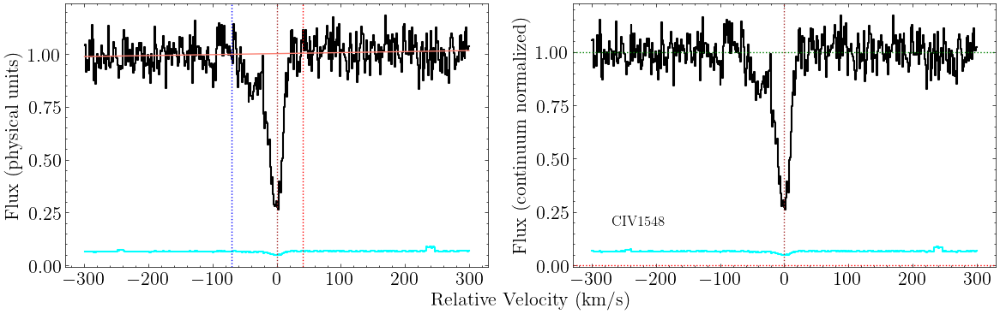

In [14]:
fig, ax = civ_1548_hires.plot_ion_transition_spec_cont()

In [229]:
civ_1548_hires.get_EW_total(-70,40)

Integration window: [-70, 40]
EW, 1sig: 120, 4
EW-3sig: 11.415


In [230]:
civ_1548_hires.grab_ion_transition_lsf(lsf_fits_list)

In [231]:
civ_1548_hires.init_ion_transition(init_values = np.array([[13.45, 11, 0],[12.93, 23, -25]]), 
                             lsf_convolve = True)

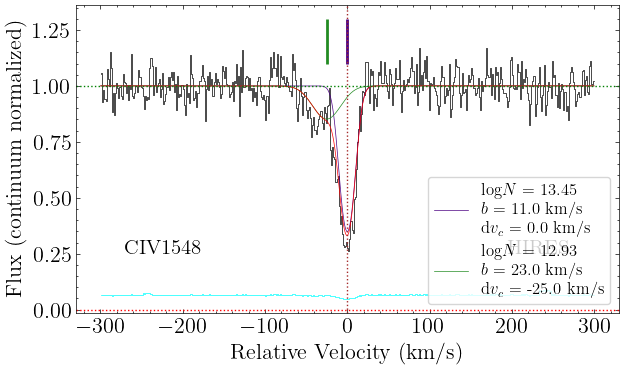

In [232]:
fig, ax = civ_1548_hires.plot_ion_transition_init_fit()

In [233]:
civ_1548_hires.fit_ion_transition()

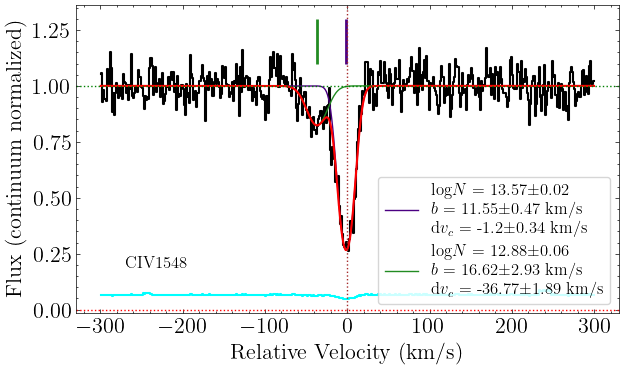

In [234]:
fig, ax = civ_1548_hires.plot_ion_transition_best_fit()

## CIV 1550 (HIRES)

In [235]:
civ_1550_hires = ion_transition('CIV', 1550, 'C', z_sys, 'HIRES')

In [236]:
civ_1550_hires.grab_ion_transition_info()

In [237]:
civ_1550_hires.grab_ion_transition_spec(spec_fits_list, v_range=[-300,300], masks=[[-300,-280]])

In [238]:
civ_1550_hires.cont_norm_flux(v_abs_range=[-50,50], degree=1)

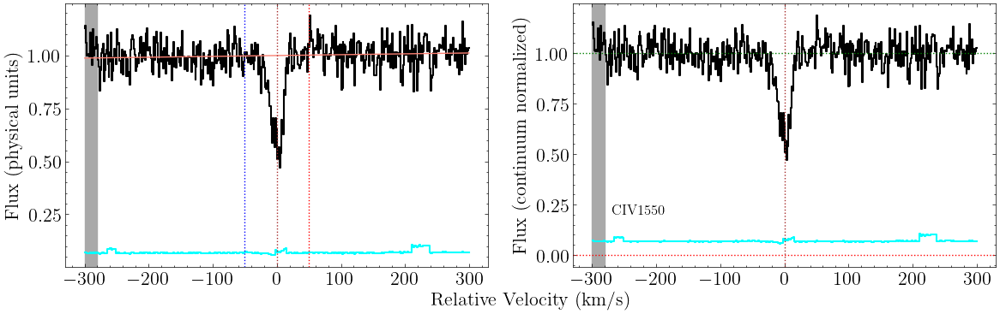

In [239]:
fig, ax = civ_1550_hires.plot_ion_transition_spec_cont()

In [240]:
civ_1550_hires.get_EW_total(-50,50)

Integration window: [-50, 50]
EW, 1sig: 55, 4
EW-3sig: 12.100


In [241]:
civ_1550_hires.grab_ion_transition_lsf(lsf_fits_list)

In [242]:
civ_1550_hires.init_ion_transition(init_values = np.array([[13.45, 11, 0],[12.93, 23, -25]]), 
                             lsf_convolve = True)

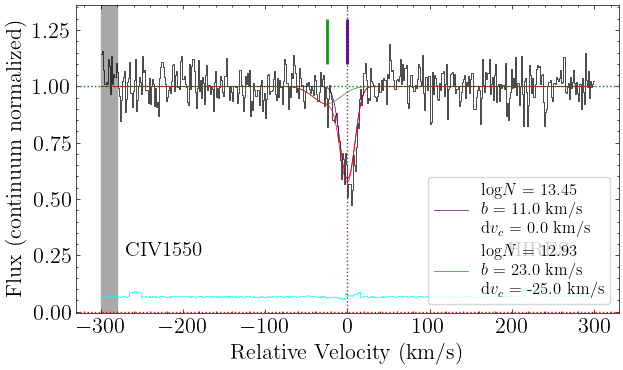

In [243]:
fig, ax = civ_1550_hires.plot_ion_transition_init_fit()

In [244]:
civ_1550_hires.fit_ion_transition()

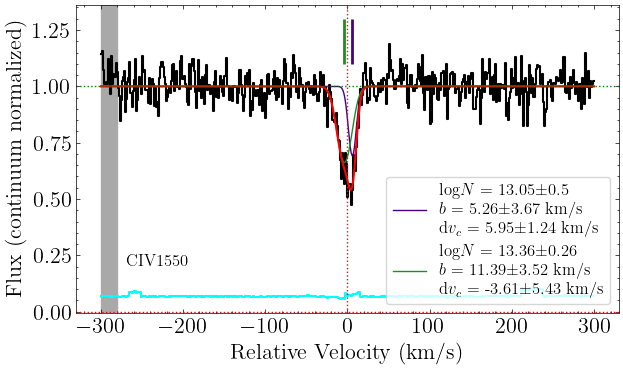

In [245]:
fig, ax = civ_1550_hires.plot_ion_transition_best_fit()

## CIV ion

In [246]:
civ = ion(z_sys, 'CIV', [civ_1548_hires, civ_1550_hires])

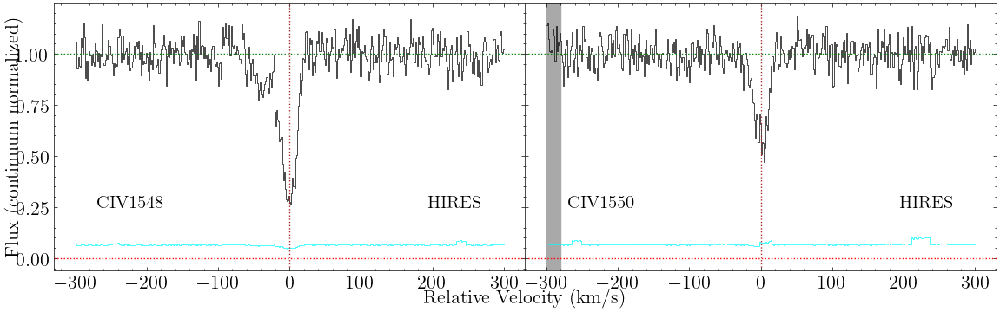

In [247]:
fig, axes = civ.plot_ion()

In [248]:
civ.init_ion([civ_1548_hires.best_values, civ_1548_hires.best_values])
#ciii.init_ion(np.array([[13.42,16,-1.15]]))

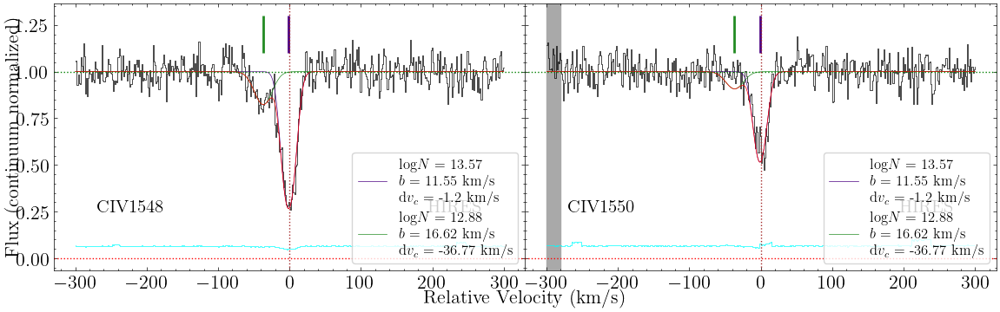

In [249]:
fig, axes = civ.plot_ion_init_fit()

In [250]:
civ.fit_ion(tie_params_list = [['it1c1_logN', 'it2c1_logN'],
                               ['it1c1_b', 'it2c1_b'],
                               ['it1c1_dv_c', 'it2c1_dv_c'],
                               ['it1c2_logN', 'it2c2_logN'],
                               ['it1c2_b', 'it2c2_b'],
                               ['it1c2_dv_c', 'it2c2_dv_c']
                              ])

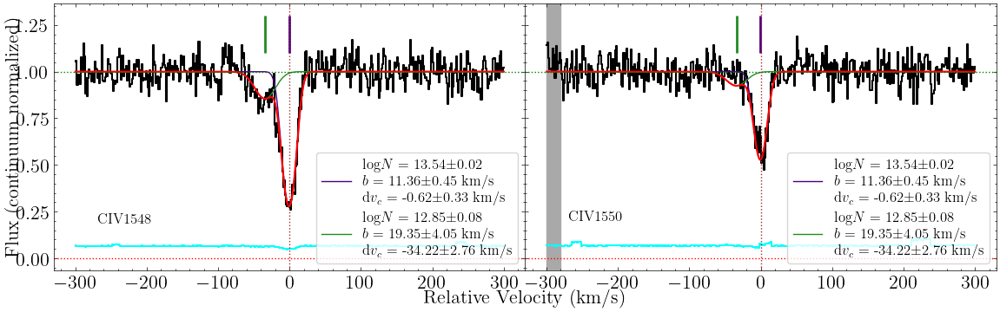

In [251]:
fig, axes = civ.plot_ion_best_fit()

In [252]:
#civ.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-7, n_walkers=100, n_steps=2500)
#civ.fit_ion_emcee(load=True, loaddir=rootdir)

In [253]:
#fig, axes = civ.plot_samples()

In [254]:
#civ.plot_corner()

# OIII

## OIII 702

Get the OIII 702 line in COS FUV

In [255]:
oiii_702_fuv = ion_transition('OIII', 702,  'O', z_sys, 'COS FUV')

In [256]:
oiii_702_fuv.grab_ion_transition_info(delta_v = 2.6)

In [257]:
oiii_702_fuv.grab_ion_transition_spec(spec_fits_list)

In [258]:
oiii_702_fuv.cont_norm_flux(v_abs_range=[-80,40], degree=1)

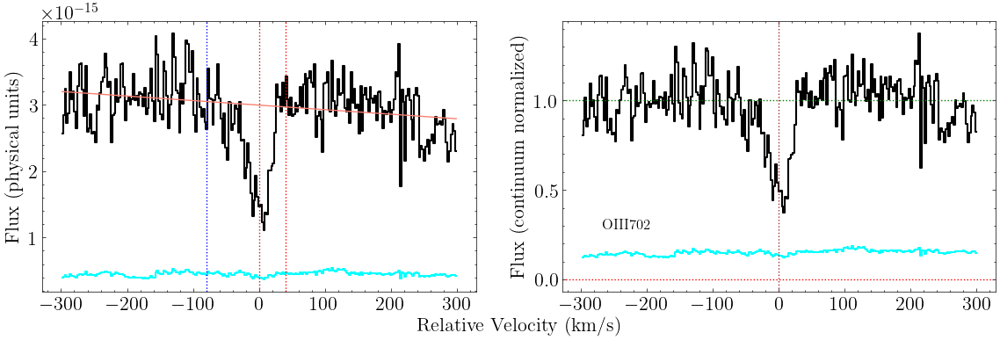

In [259]:
fig, ax = oiii_702_fuv.plot_ion_transition_spec_cont()

In [260]:
oiii_702_fuv.get_EW_total(-80,40)

Integration window: [-80, 40]
EW, 1sig: 52, 6
EW-3sig: 17.396


In [261]:
oiii_702_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [262]:
oiii_702_fuv.init_ion_transition(init_values = np.array([[14.2, 12, 0],[13.6,30,-25]]), 
                             lsf_convolve = True)

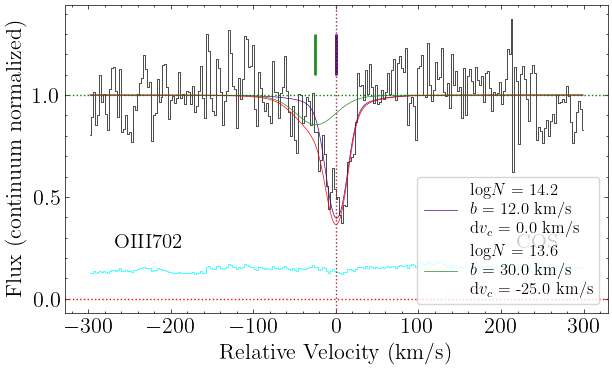

In [263]:
fig, ax = oiii_702_fuv.plot_ion_transition_init_fit()

In [264]:
oiii_702_fuv.fit_ion_transition()

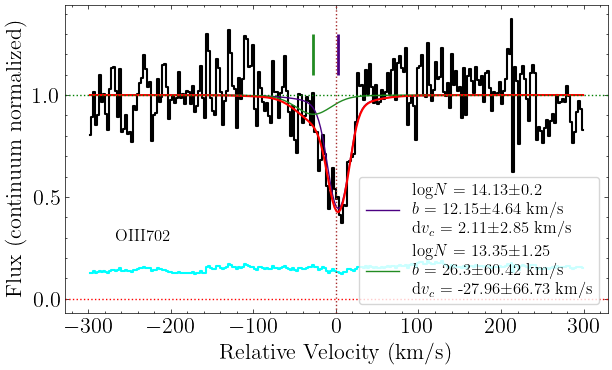

In [265]:
fig, ax = oiii_702_fuv.plot_ion_transition_best_fit()

## OIII 832 (NUV)

Load OIII 832 from COS NUV

In [266]:
oiii_832_nuv = ion_transition('OIII', 832, 'O', z_sys, 'COS NUV')

In [267]:
oiii_832_nuv.grab_ion_transition_info(delta_v=-11.1)

In [268]:
oiii_832_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-250],[-120,-30],[20,80]])

In [269]:
oiii_832_nuv.cont_norm_flux(v_abs_range=[-120,80], degree=1)

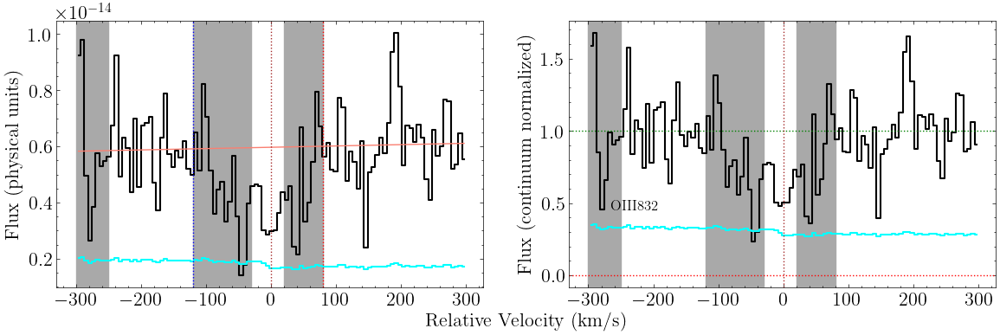

In [270]:
fig, ax = oiii_832_nuv.plot_ion_transition_spec_cont()

In [271]:
oiii_832_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [272]:
oiii_832_nuv.init_ion_transition(init_values = np.array([[14.2, 15, 0]]), 
                             lsf_convolve = True)

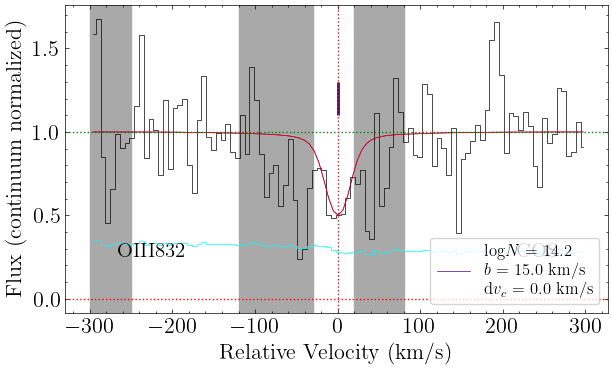

In [273]:
fig, ax = oiii_832_nuv.plot_ion_transition_init_fit()

In [274]:
oiii_832_nuv.fit_ion_transition(fix_params_list = ['it1c1_b', 'it1c1_dv_c'])

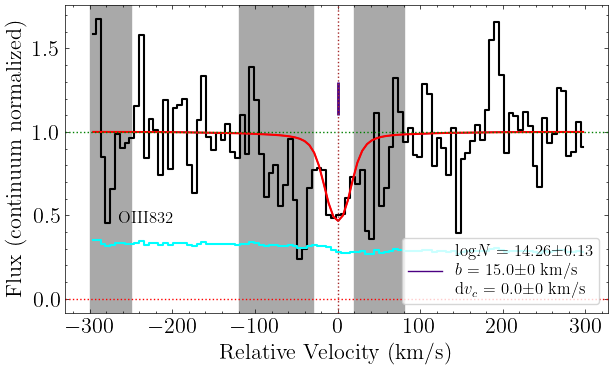

In [275]:
fig, ax = oiii_832_nuv.plot_ion_transition_best_fit()

## OIII ion

Compile the OIII ion

In [276]:
oiii = ion(z_sys, 'OIII', [oiii_702_fuv])

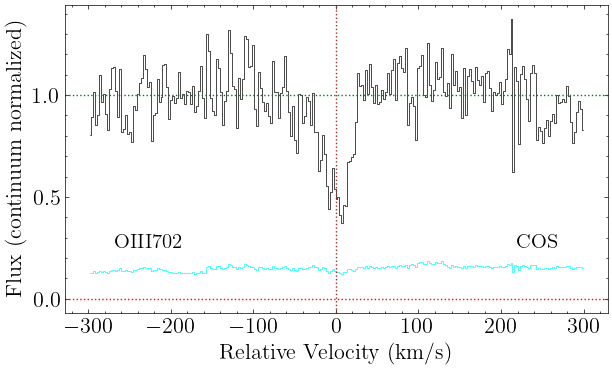

In [277]:
fig, axes = oiii.plot_ion()

In [278]:
oiii.init_ion([[[14.2, 15, 0]],[[14.2, 15, 0]]])
#oiii.init_ion(np.array([[14.19, 17.10, -0.56]]))

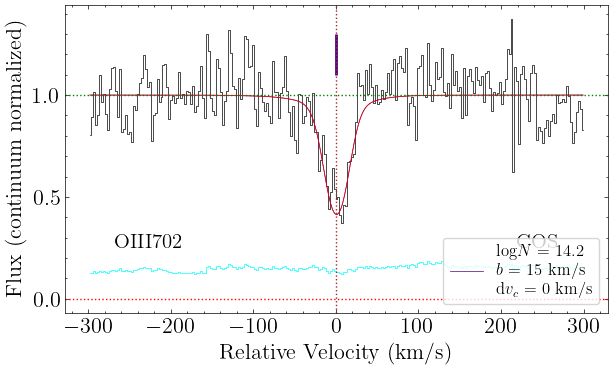

In [279]:
fig, axes = oiii.plot_ion_init_fit()

In [280]:
oiii.fit_ion(lower_bounds_dict = {'it1c1_b': 7}, 
             fix_params_list = ['it1c1_dv_c'])

#oiii.fit_ion(tie_params_list = [['it1c1_logN', 'it2c1_logN'],
#                                ['it1c1_b', 'it2c1_b'],
#                                ['it1c1_dv_c', 'it2c1_dv_c']],   
#             fix_params_list = ['it1c1_dv_c'])
            #upper_bounds_dict={'it1c1_logN':14.5})

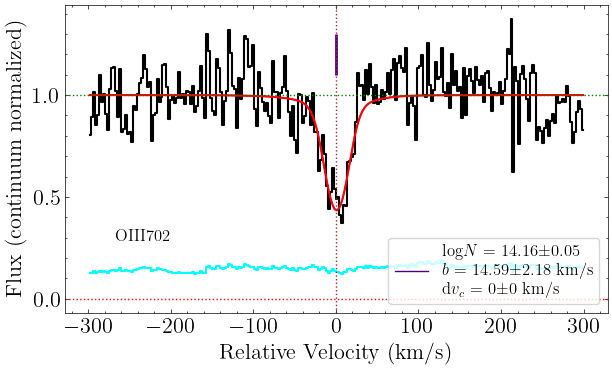

In [281]:
fig, axes = oiii.plot_ion_best_fit()

In [282]:
#oiii.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-6, n_walkers=100, n_steps=2500)
#oiii.fit_ion_emcee(load=True, loaddir=rootdir)

In [283]:
#fig, axes = oiii.plot_samples()

In [284]:
#oiii.plot_corner()

# OIV

## OIV 553

Begin with OIV 553 in COS FUV

In [285]:
oiv_553_fuv = ion_transition('OIV', 553, 'O', z_sys, 'COS FUV')

In [286]:
oiv_553_fuv.grab_ion_transition_info(delta_v=5)

In [287]:
oiv_553_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-160],[130,300]])

In [288]:
oiv_553_fuv.cont_norm_flux(v_abs_range=[-80,80], degree=1)

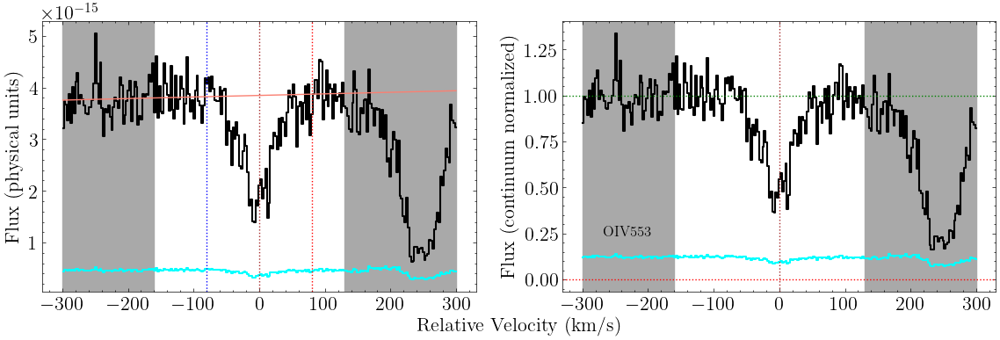

In [289]:
fig, ax = oiv_553_fuv.plot_ion_transition_spec_cont()

In [290]:
oiv_553_fuv.get_EW_total(-70,50)

Integration window: [-70, 50]
EW, 1sig: 57, 3
EW-3sig: 10.293


In [291]:
oiv_553_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [292]:
oiv_553_fuv.init_ion_transition(init_values = np.array([[14.4, 15, 0],
                                                     [13.8, 25, -25]]), 
                             lsf_convolve = True)

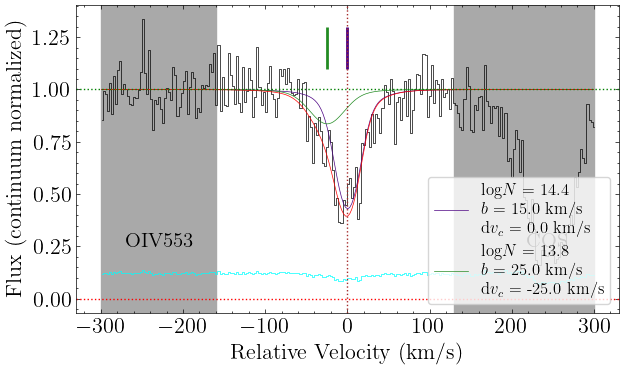

In [293]:
fig, ax = oiv_553_fuv.plot_ion_transition_init_fit()

In [294]:
oiv_553_fuv.fit_ion_transition(fix_params_list=['it1c1_dv_c', 'it1c2_dv_c'])

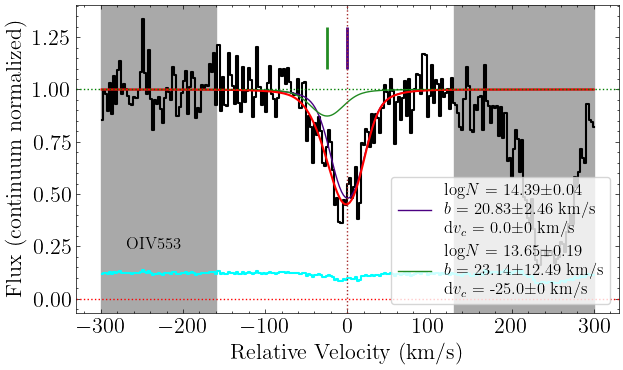

In [295]:
fig, ax = oiv_553_fuv.plot_ion_transition_best_fit()

## OIV 608

Next, OIV 608 from COS FUV

In [296]:
oiv_608_fuv = ion_transition('OIV', 608, 'O', z_sys, 'COS FUV')

In [297]:
oiv_608_fuv.grab_ion_transition_info()

In [298]:
oiv_608_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-180,-115],[200,300]])

In [299]:
oiv_608_fuv.cont_norm_flux(v_abs_range=[-75,60], degree=1)

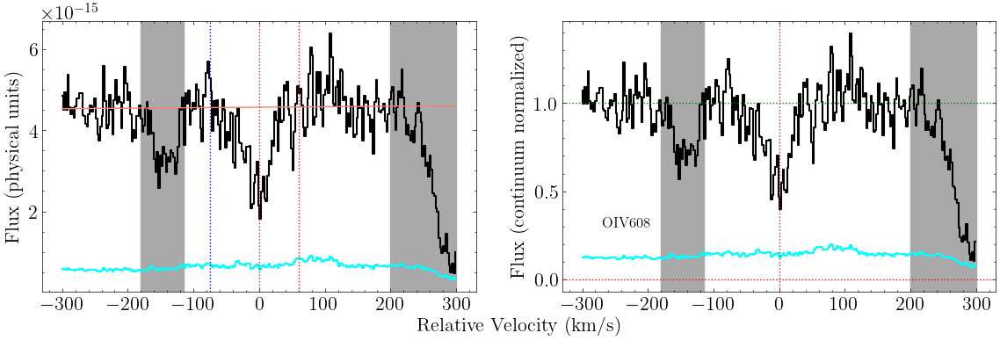

In [300]:
fig, ax = oiv_608_fuv.plot_ion_transition_spec_cont()

In [301]:
oiv_608_fuv.get_EW_total(-75,60)

Integration window: [-75, 60]
EW, 1sig: 49, 5
EW-3sig: 15.391


In [302]:
oiv_608_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [303]:
oiv_608_fuv.init_ion_transition(init_values = np.array([[14.36, 10 , 0],[14,20,-25]]), 
                             lsf_convolve = True)

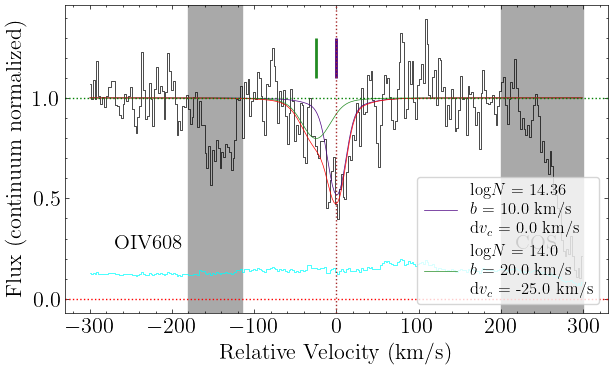

In [304]:
fig, ax = oiv_608_fuv.plot_ion_transition_init_fit()

In [305]:
oiv_608_fuv.fit_ion_transition(fix_params_list = ['it1c2_dv_c'])

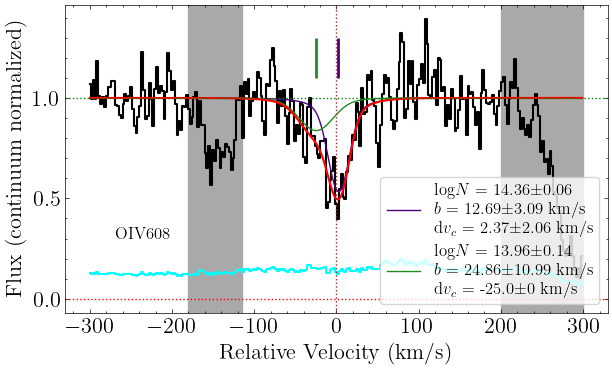

In [306]:
fig, ax = oiv_608_fuv.plot_ion_transition_best_fit()

## OIV 787

Finally, OIV 787

In [307]:
oiv_787_fuv = ion_transition('OIV', 787, 'O', z_sys, 'COS FUV')

In [308]:
oiv_787_fuv.grab_ion_transition_info()

In [309]:
oiv_787_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-150,-100],[145,200]])

In [310]:
oiv_787_fuv.cont_norm_flux(v_abs_range=[-75,65], degree=1)

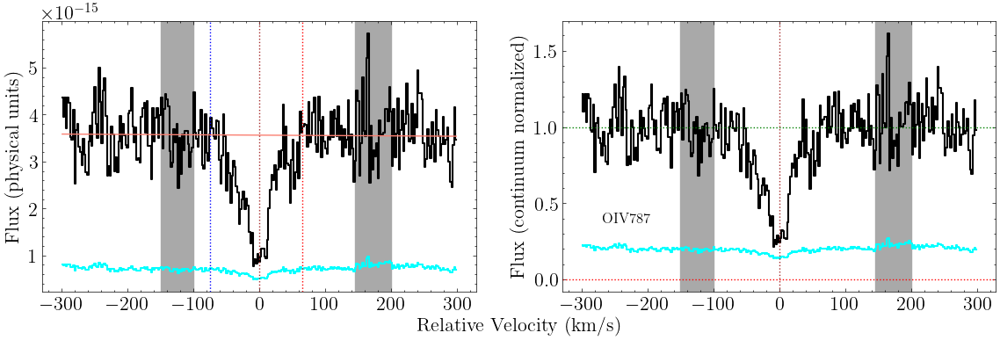

In [311]:
fig, ax = oiv_787_fuv.plot_ion_transition_spec_cont()

In [312]:
oiv_787_fuv.get_EW_total(-75,65)

Integration window: [-75, 65]
EW, 1sig: 108, 8
EW-3sig: 24.151


In [313]:
oiv_787_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [314]:
oiv_787_fuv.init_ion_transition(init_values = np.array([[14.36, 12 , 0],[13.9, 24, -25]]), 
                             lsf_convolve = True)

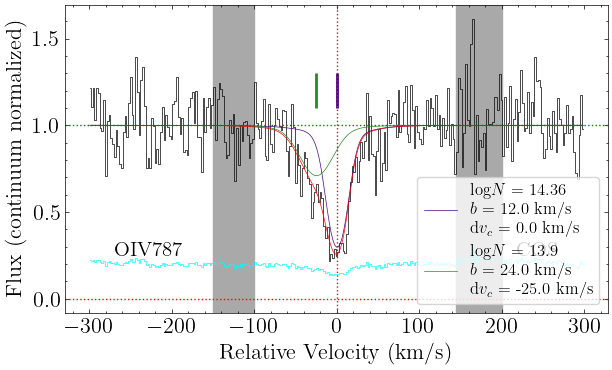

In [315]:
fig, ax = oiv_787_fuv.plot_ion_transition_init_fit()

In [316]:
oiv_787_fuv.fit_ion_transition(fix_params_list = ['it1c2_dv_c'])

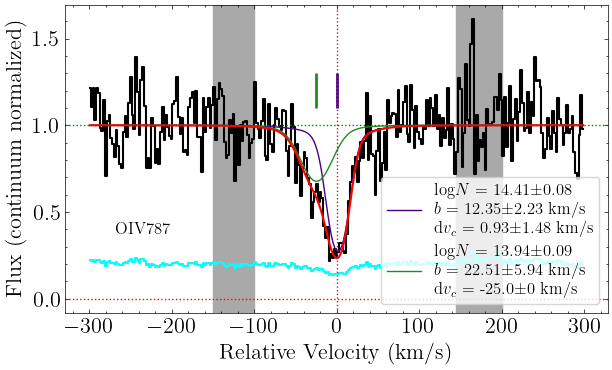

In [317]:
fig, ax = oiv_787_fuv.plot_ion_transition_best_fit()

## OIV ion

Compile the OIV ion

In [318]:
oiv = ion(z_sys, 'OIV', [oiv_553_fuv, oiv_608_fuv, oiv_787_fuv])

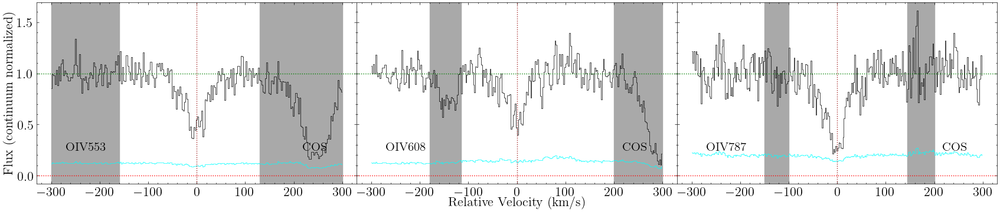

In [319]:
fig, axes = oiv.plot_ion(n_cols=3)

In [320]:
# High logN difference
oiv.init_ion([[[14.44, 14.5, 0],[13.73, 25, -25]],
              [[14.44, 14.5, 0],[13.73, 25, -25]],
              [[14.44, 14.5, 0],[13.73, 25, -25]],])

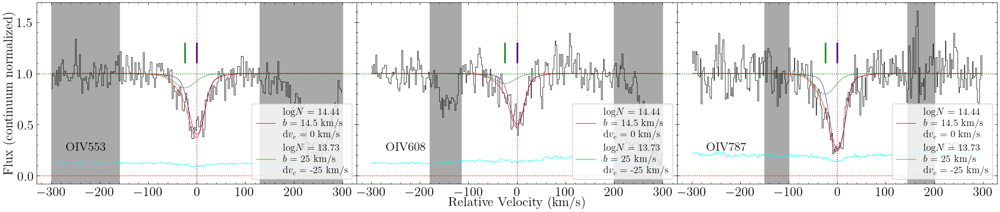

In [321]:
fig, axes = oiv.plot_ion_init_fit(n_cols=3)

In [322]:
oiv.fit_ion(tie_params_list = [['it1c1_logN', 'it2c1_logN'],
                               ['it1c1_logN', 'it3c1_logN'],
                               ['it1c1_b', 'it2c1_b'],
                               ['it1c1_b', 'it3c1_b'],
                               ['it1c1_dv_c', 'it2c1_dv_c'],
                               ['it1c1_dv_c', 'it3c1_dv_c'],
                               ['it1c2_logN', 'it2c2_logN'],
                               ['it1c2_logN', 'it3c2_logN'],
                               ['it1c2_b', 'it2c2_b'],
                               ['it1c2_b', 'it3c2_b'],
                               ['it1c2_dv_c', 'it2c2_dv_c'],
                               ['it1c2_dv_c', 'it3c2_dv_c']],
           exclude_models = ['it1c1_b > it1c2_b'],
           #upper_bounds_dict = {'it1c2_b':35},
           fix_params_list=['it1c1_dv_c', 'it1c2_dv_c'])

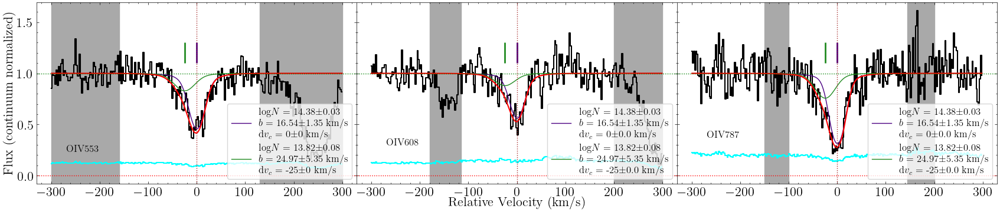

In [323]:
fig, axes = oiv.plot_ion_best_fit(n_cols=3)

In [324]:
#oiv.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-6, n_walkers=100, n_steps=2500)
#oiv.fit_ion_emcee(load=True, loaddir=rootdir)

In [325]:
#fig, axes = oiv.plot_samples(n_cols=3)

In [326]:
#oiv.plot_corner()

## OIV 554

Next, do OIV 554 in COS FUV

In [327]:
oiv_554_fuv = ion_transition('OIV', 554, 'O', z_sys, 'COS FUV')

In [328]:
oiv_554_fuv.grab_ion_transition_info()

In [329]:
oiv_554_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-220,-110],[85,200]])

In [330]:
oiv_554_fuv.cont_norm_flux(v_abs_range=[-75,70], degree=1)

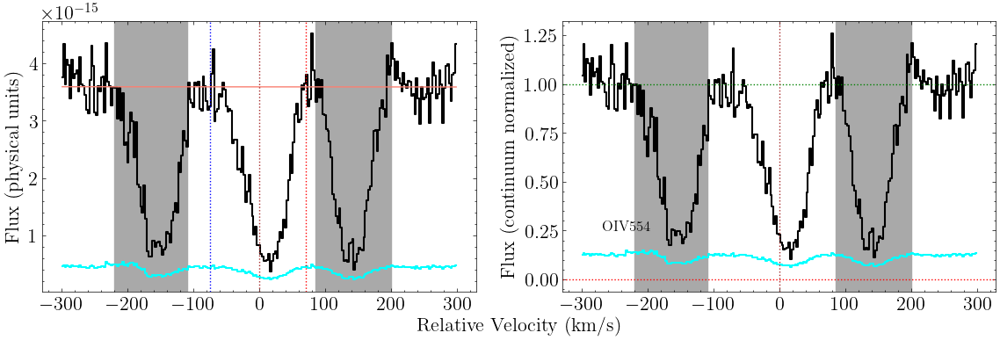

In [331]:
fig, ax = oiv_554_fuv.plot_ion_transition_spec_cont()

In [332]:
oiv_554_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [333]:
oiv_554_fuv.init_ion_transition(init_values = np.array(oiv.best_values_list[0]).reshape((2,3)), 
                             lsf_convolve = True)

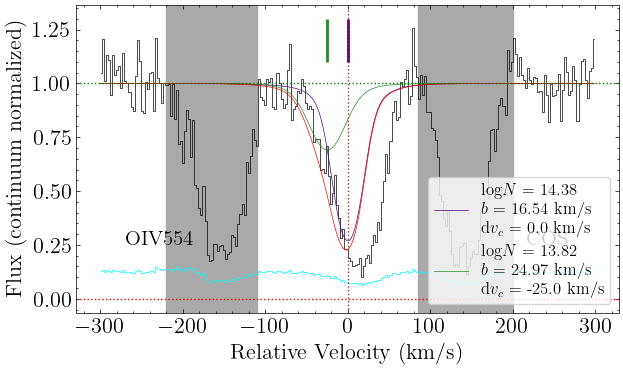

In [334]:
fig, ax = oiv_554_fuv.plot_ion_transition_init_fit()

# OV

## OV 629

Grab OV 629 from COS FUV

In [335]:
ov_629_fuv = ion_transition('OV', 629, 'O', z_sys, 'COS FUV')

In [336]:
ov_629_fuv.grab_ion_transition_info()

In [337]:
ov_629_fuv.grab_ion_transition_spec(spec_fits_list)

In [338]:
ov_629_fuv.cont_norm_flux(v_abs_range=[-110,50], degree=1)

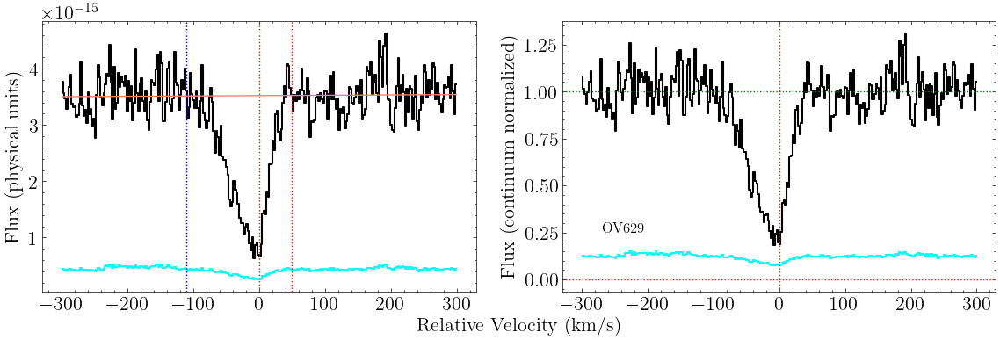

In [339]:
fig, ax = ov_629_fuv.plot_ion_transition_spec_cont()

In [340]:
ov_629_fuv.get_EW_total(-110,50)

Integration window: [-110, 50]
EW, 1sig: 106, 4
EW-3sig: 12.535


In [341]:
ov_629_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [342]:
ov_629_fuv.init_ion_transition(init_values = np.array([[13.94, 10 , 0],
                                                    [13.67, 22, -30]]), 
                             lsf_convolve = True)

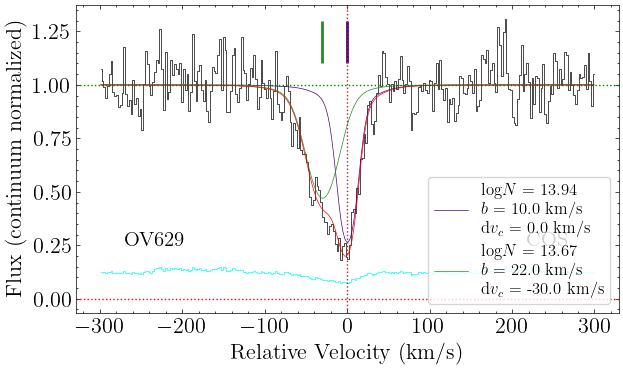

In [343]:
fig, ax = ov_629_fuv.plot_ion_transition_init_fit()

In [344]:
ov_629_fuv.fit_ion_transition()

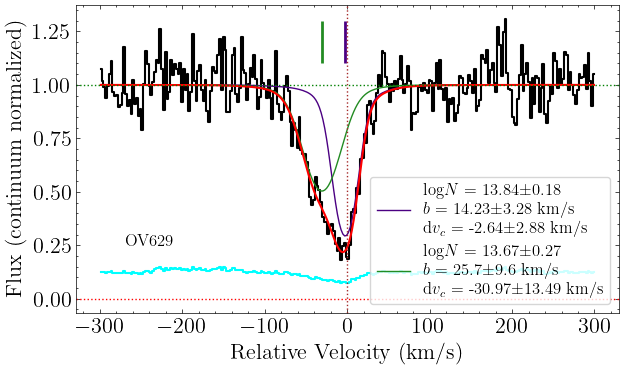

In [345]:
fig, ax = ov_629_fuv.plot_ion_transition_best_fit()

## OV ion

Make the OV ion

In [346]:
ov = ion(z_sys, 'OV', [ov_629_fuv])

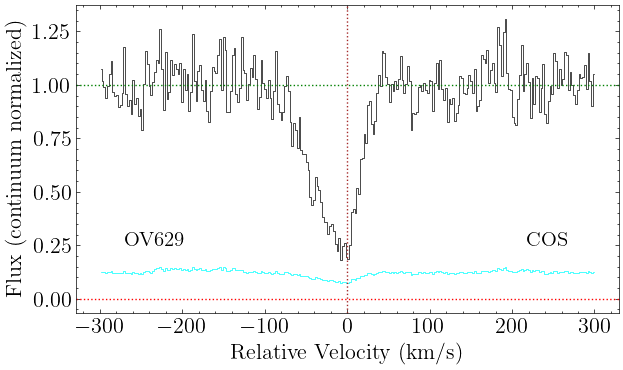

In [347]:
fig, axes = ov.plot_ion()

In [348]:
ov.init_ion([[[13.6, 11, 0], [13.8, 27, -25]]])
#ov.init_ion(np.array([[14.,18.,-6.],[13.55,30.,-38.]]))

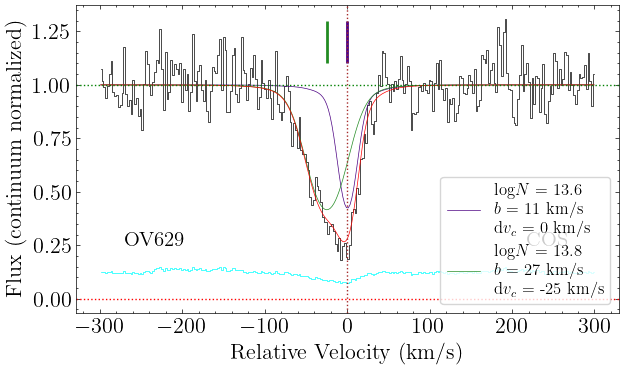

In [349]:
fig, axes = ov.plot_ion_init_fit()

In [350]:
ov.fit_ion(#lower_bounds_dict = {'it1c1_b':6},
           #upper_bounds_dict = {'it1c1_b':20},
           exclude_models = ['it1c2_logN < it1c1_logN'],
           fix_params_list = ['it1c1_dv_c', 'it1c2_dv_c'])

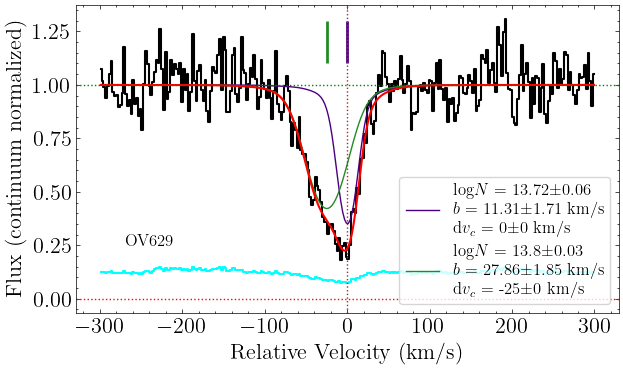

In [351]:
fig, axes = ov.plot_ion_best_fit()

In [352]:
#ov.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-8, n_walkers=100, n_steps=2500)
#ov.fit_ion_emcee(load=True, loaddir=rootdir)

In [353]:
#fig, axes = ov.plot_samples()

In [354]:
#ov.plot_corner()

# OVI

## OVI 1031 (STIS)

First do OVI 1031 from STIS

In [355]:
ovi_1031_stis = ion_transition('OVI', 1031, 'O', z_sys, 'STIS')

In [356]:
ovi_1031_stis.grab_ion_transition_info()

In [357]:
ovi_1031_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-250,-170],[50,190]])

In [358]:
ovi_1031_stis.cont_norm_flux(v_abs_range=[-70,50], degree=1)

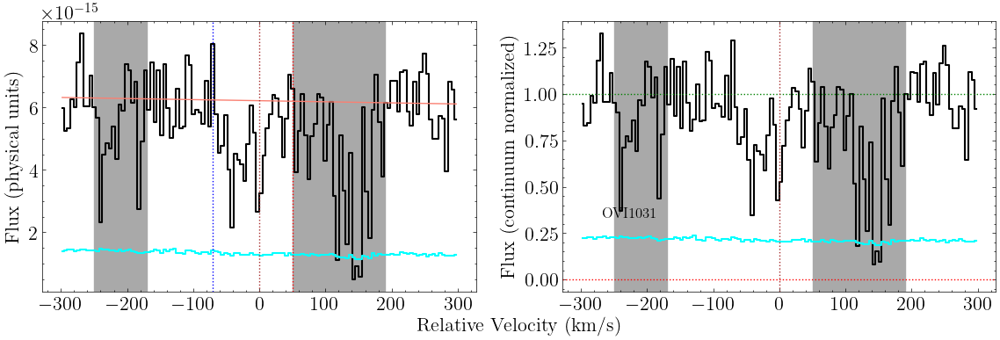

In [359]:
fig, ax = ovi_1031_stis.plot_ion_transition_spec_cont()

In [360]:
ovi_1031_stis.get_EW_total(-70,60)

Integration window: [-70, 60]
EW, 1sig: 86, 18
EW-3sig: 52.540


In [361]:
ovi_1031_stis.grab_ion_transition_lsf(lsf_fits_list)

In [362]:
ovi_1031_stis.init_ion_transition(init_values = np.array([[13.78, 23, -30]]), 
                             lsf_convolve = True)

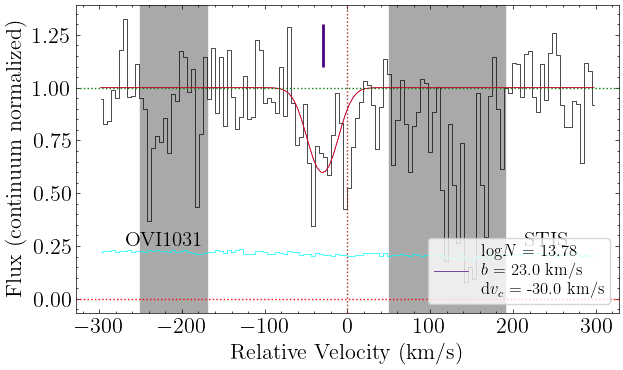

In [363]:
fig, ax = ovi_1031_stis.plot_ion_transition_init_fit()

In [364]:
ovi_1031_stis.fit_ion_transition()

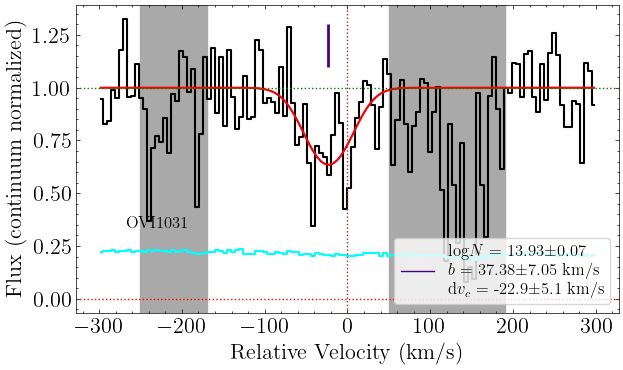

In [365]:
fig, ax = ovi_1031_stis.plot_ion_transition_best_fit()

## OVI 1037 (STIS)

Then do OVI 1037 from COS STIS

In [366]:
ovi_1037_stis = ion_transition('OVI', 1037, 'O', z_sys, 'STIS')

In [367]:
ovi_1037_stis.grab_ion_transition_info()

In [368]:
ovi_1037_stis.grab_ion_transition_spec(spec_fits_list, masks=[[40,70],[160,250]])

In [369]:
ovi_1037_stis.cont_norm_flux(v_abs_range=[-70,70], degree=1)

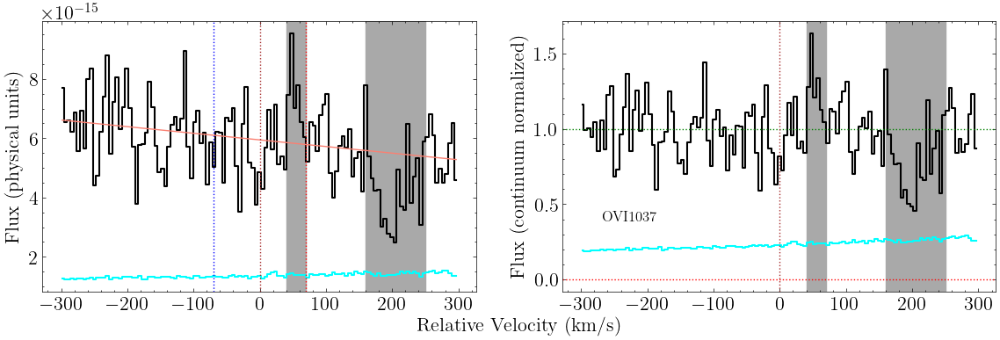

In [370]:
fig, ax = ovi_1037_stis.plot_ion_transition_spec_cont()

In [371]:
ovi_1037_stis.get_EW_total(-70,70)

Integration window: [-70, 70]
EW, 1sig: -2, 20
EW-3sig: 61.331


In [372]:
ovi_1037_stis.grab_ion_transition_lsf(lsf_fits_list)

In [373]:
ovi_1037_stis.init_ion_transition(init_values = np.array([[13.78, 23, -30]]), 
                             lsf_convolve = True)

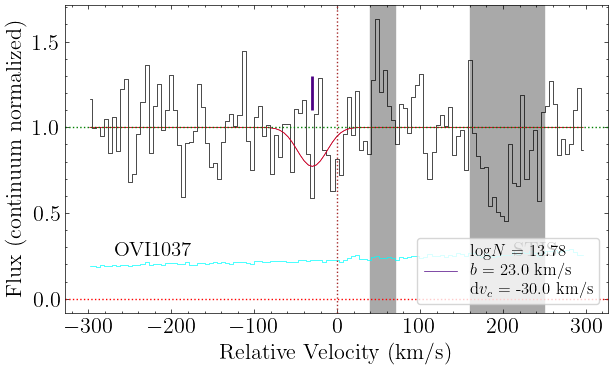

In [374]:
fig, ax = ovi_1037_stis.plot_ion_transition_init_fit()

In [375]:
ovi_1037_stis.fit_ion_transition()

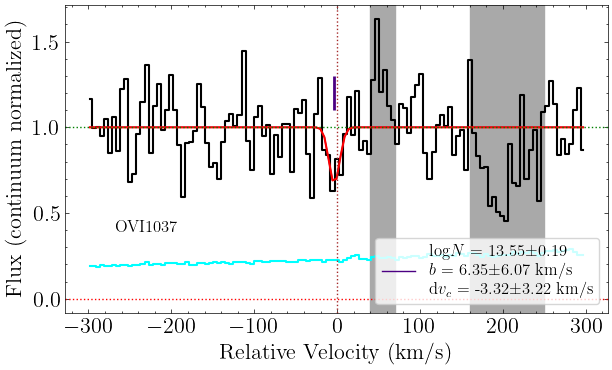

In [376]:
fig, ax = ovi_1037_stis.plot_ion_transition_best_fit()

## OVI ion

Now compile the OVI ion

In [377]:
ovi = ion(z_sys, 'OVI', [ovi_1031_stis, ovi_1037_stis])

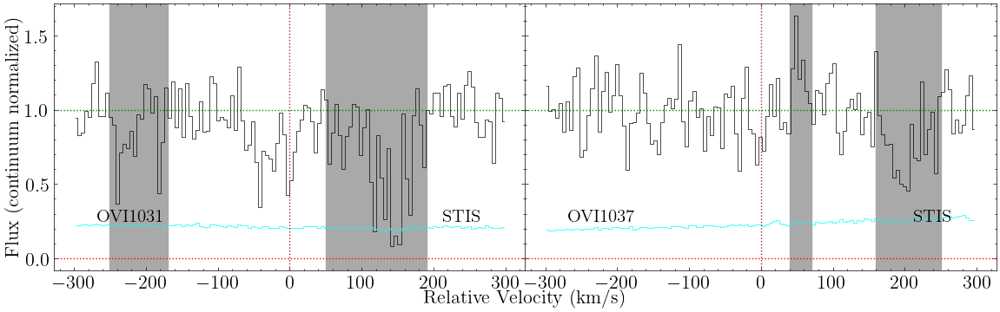

In [378]:
fig, axes = ovi.plot_ion()

In [379]:
ovi.init_ion([[[13.9, 36, -25]], [[13.9, 36, -25]]])
#ovi.init_ion(np.array([[13.61, 14, -5],[13.78, 24, -34]]))
#ovi.init_ion(np.array([[13.8, 35, -28]]))

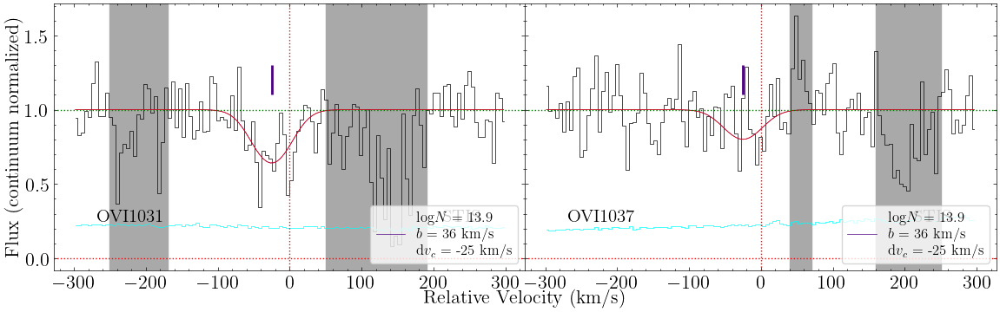

In [380]:
fig, axes = ovi.plot_ion_init_fit()

In [381]:
#ovi.fit_ion()

ovi.fit_ion(tie_params_list = [['it1c1_logN', 'it2c1_logN'],
                               ['it1c1_b', 'it2c1_b'],
                               ['it1c1_dv_c', 'it2c1_dv_c']],
           fix_params_list = ['it1c1_dv_c'],
           upper_bounds_dict = {'it1c1_b': 120})

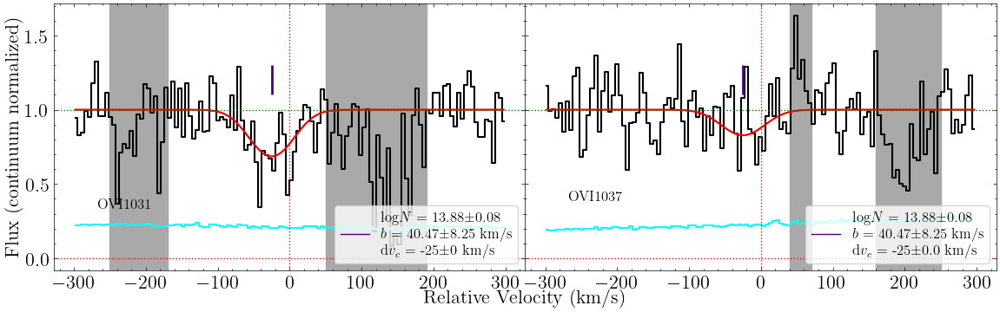

In [382]:
fig, axes = ovi.plot_ion_best_fit()

In [383]:
#.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-8, n_walkers=100, n_steps=2500)
#ovi.fit_ion_emcee(load=True, loaddir=rootdir)

In [384]:
#fig, axes = ovi.plot_samples()

In [385]:
#ovi.plot_corner()

# SiIII

## SiIII 1206 (STIS)
Get SiIII 1206 from COS STIS

In [386]:
siiii_1206_stis = ion_transition('SiIII', 1206, 'Si', z_sys, 'STIS')

In [387]:
siiii_1206_stis.grab_ion_transition_info(delta_v=6)

In [388]:
siiii_1206_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-150,-30],[35,120]])

In [389]:
siiii_1206_stis.cont_norm_flux(v_abs_range=[-20,35], degree=1)

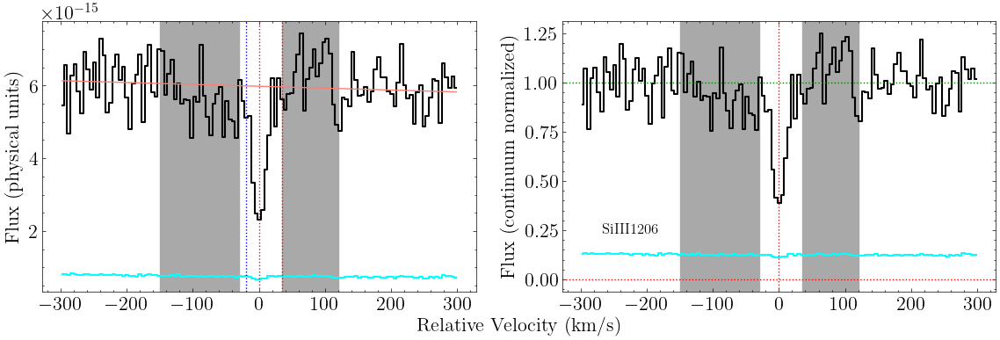

In [390]:
fig, ax = siiii_1206_stis.plot_ion_transition_spec_cont()

In [391]:
siiii_1206_stis.get_EW_total(-20,35)

Integration window: [-20, 35]
EW, 1sig: 63, 8
EW-3sig: 23.699


In [392]:
siiii_1206_stis.grab_ion_transition_lsf(lsf_fits_list)

In [393]:
siiii_1206_stis.init_ion_transition(init_values = np.array([[12.8, 11, 0]]), 
                             lsf_convolve = True)

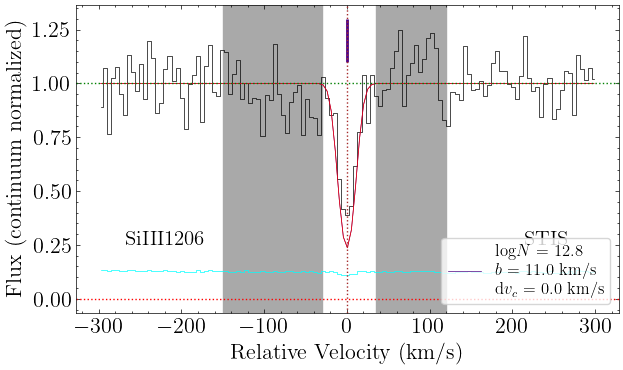

In [394]:
fig, ax = siiii_1206_stis.plot_ion_transition_init_fit()

In [395]:
siiii_1206_stis.fit_ion_transition()

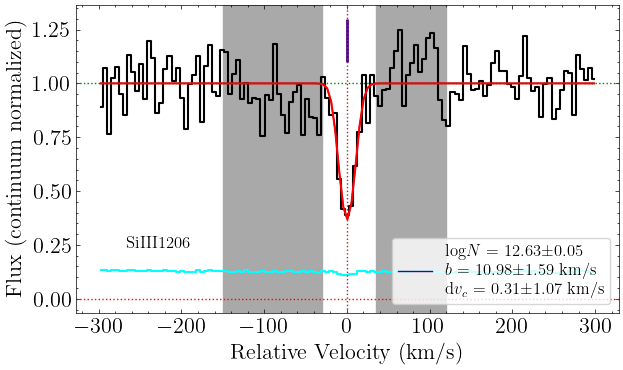

In [396]:
fig, ax = siiii_1206_stis.plot_ion_transition_best_fit()

## SiIII ion

In [397]:
siiii = ion(z_sys, 'SiIII', [siiii_1206_stis])

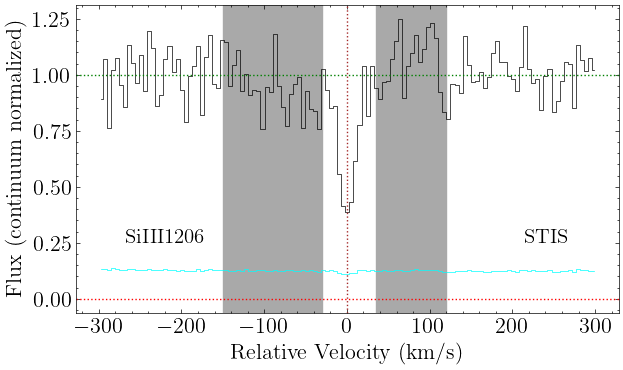

In [398]:
fig, axes = siiii.plot_ion()

In [399]:
siiii.init_ion([[[12.6, 12, 0]]])

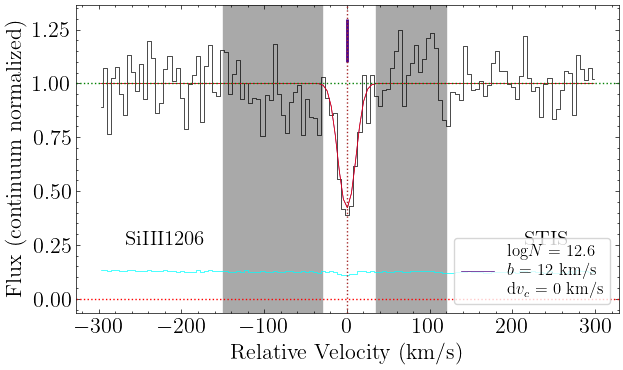

In [400]:
fig, axes = siiii.plot_ion_init_fit()

In [401]:
siiii.fit_ion(fix_params_list=['it1c1_dv_c'],
             lower_bounds_dict = {'it1c1_b':4})

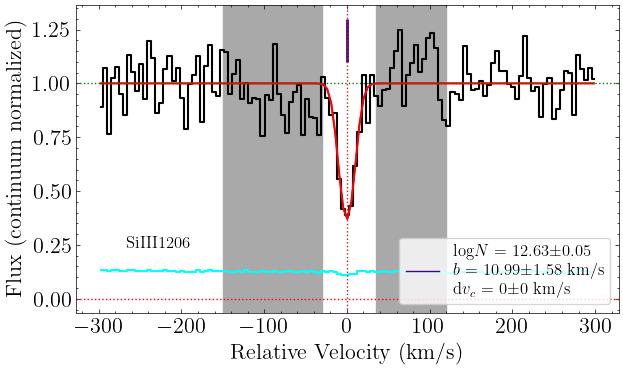

In [402]:
fig, axes = siiii.plot_ion_best_fit()

In [403]:
#siiii.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-6, n_walkers=100, n_steps=2500)
#siiii.fit_ion_emcee(load=True, loaddir=rootdir)

In [404]:
#fig, axes = siiii.plot_samples()

In [405]:
#siiii.plot_corner()

# HI+HeI+CIII+CIV+OIII+OIV+OV+OVI+SiIII

In [406]:
hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii = ion_suite(z_sys, 'HI+HeI+CIII+CIV+OIII+OIV+OV+OVI+SiIII', 
                                              [hi, hei, ciii, civ, oiii, oiv, ov, ovi, siiii])

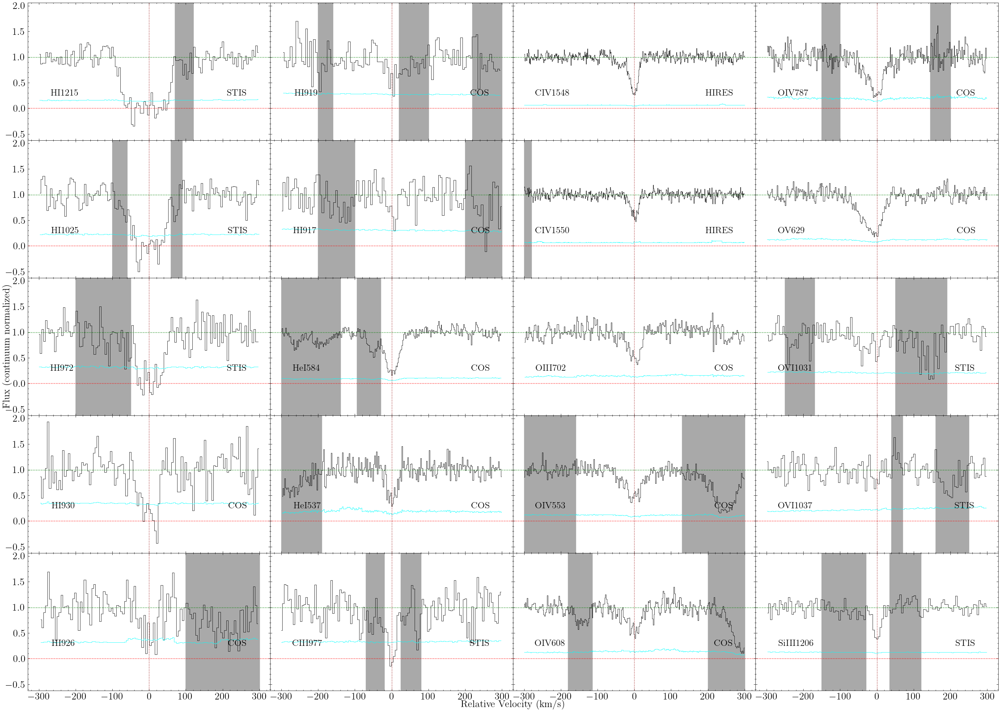

In [407]:
fig, axes = hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.plot_ion_suite(n_cols=4)

In [408]:
hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.init_ion_suite([
    [[16.10, 19, 0], [14.6, 31, -32], [14.4, 23, 22]], # HI
    [[16.10, 19, 0], [14.6, 31, -32], [14.4, 23, 22]],
    [[16.10, 19, 0], [14.6, 31, -32], [14.4, 23, 22]],
    [[16.10, 19, 0], [14.6, 31, -32], [14.4, 23, 22]],
    [[16.10, 19, 0], [14.6, 31, -32], [14.4, 23, 22]],
    [[16.10, 19, 0], [14.6, 31, -32], [14.4, 23, 22]],
    [[16.10, 19, 0], [14.6, 31, -32], [14.4, 23, 22]],
    [[14.52, 14, 0]], # HeI
    [[14.52, 14, 0]],
    [[13.53, 11, 0]], # CIII
    [[13.53, 11, 0],[12.95, 27, -32]], # CIV
    [[13.53, 11, 0],[12.95, 27, -32]],
    [[14.43, 11, 0]], # OIII
    [[14.43, 11, 0], [13.52, 27, -32]], # OIV
    [[14.43, 11, 0], [13.52, 27, -32]],
    [[14.43, 11, 0], [13.52, 27, -32]],
    [[13.7, 11, 0], [13.8, 27, -32]], # OV
    [[13.64, 27, -32]], # OVI
    [[13.64, 27, -32]],
    [[12.62, 12, 0]],
])

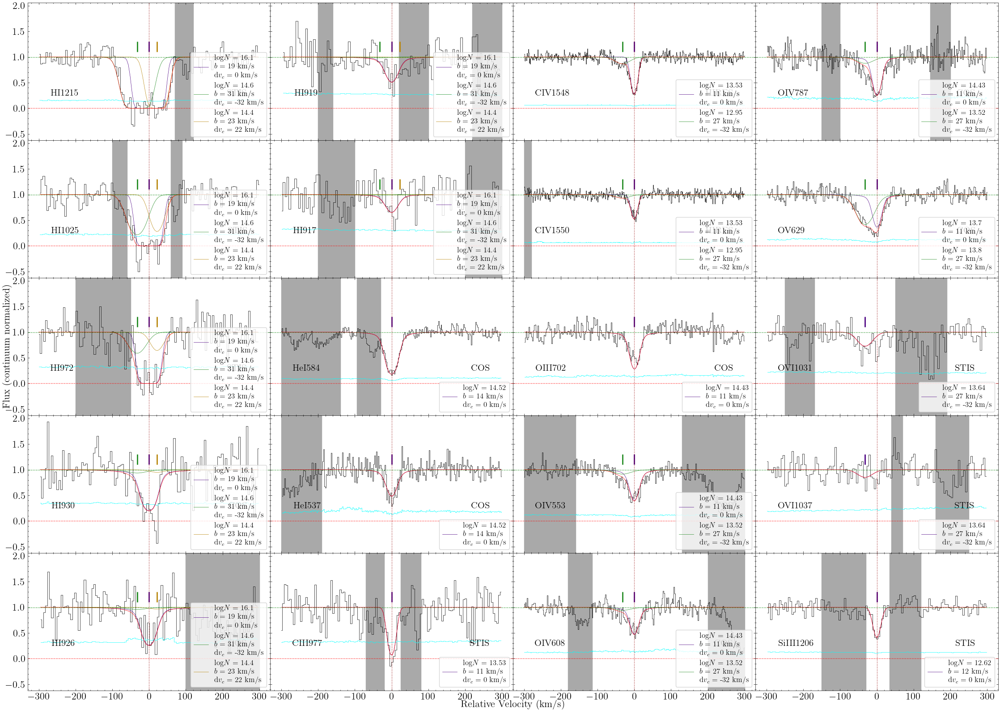

In [409]:
fig, axes = hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.plot_ion_suite_init_fit(n_cols=4)

In [410]:
hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.fit_ion_suite(tie_params_list = [
    ['it1c1_logN', 'it2c1_logN'], # Tie logN for HI component 1
    ['it1c1_logN', 'it3c1_logN'],
    ['it1c1_logN', 'it4c1_logN'],
    ['it1c1_logN', 'it5c1_logN'],
    ['it1c1_logN', 'it6c1_logN'],
    ['it1c1_logN', 'it7c1_logN'],
    ['it1c1_b', 'it2c1_b'], # Tie b for HI component 1
    ['it1c1_b', 'it3c1_b'],
    ['it1c1_b', 'it4c1_b'],
    ['it1c1_b', 'it5c1_b'],
    ['it1c1_b', 'it6c1_b'],
    ['it1c1_b', 'it7c1_b'],
    ['it1c2_logN', 'it2c2_logN'], # Tie logN for HI component 2
    ['it1c2_logN', 'it3c2_logN'],
    ['it1c2_logN', 'it4c2_logN'],
    ['it1c2_logN', 'it5c2_logN'],
    ['it1c2_logN', 'it6c2_logN'],
    ['it1c2_logN', 'it7c2_logN'],
    ['it1c2_b', 'it2c2_b'], # Tie b for HI component 2
    ['it1c2_b', 'it3c2_b'],
    ['it1c2_b', 'it4c2_b'],
    ['it1c2_b', 'it5c2_b'],
    ['it1c2_b', 'it6c2_b'],
    ['it1c2_b', 'it7c2_b'],
    ['it1c3_logN', 'it2c3_logN'], # Tie logN for HI component 3
    ['it1c3_logN', 'it3c3_logN'],
    ['it1c3_logN', 'it4c3_logN'],
    ['it1c3_logN', 'it5c3_logN'],
    ['it1c3_logN', 'it6c3_logN'],
    ['it1c3_logN', 'it7c3_logN'],
    ['it1c3_b', 'it2c3_b'], # Tie b for HI component 3
    ['it1c3_b', 'it3c3_b'],
    ['it1c3_b', 'it4c3_b'],
    ['it1c3_b', 'it5c3_b'],
    ['it1c3_b', 'it6c3_b'],
    ['it1c3_b', 'it7c3_b'],
    ['it1c3_dv_c', 'it2c3_dv_c'], # Tie dv_c for HI component 3
    ['it1c3_dv_c', 'it3c3_dv_c'],
    ['it1c3_dv_c', 'it4c3_dv_c'],
    ['it1c3_dv_c', 'it5c3_dv_c'],
    ['it1c3_dv_c', 'it6c3_dv_c'],
    ['it1c3_dv_c', 'it7c3_dv_c'],
    ['it8c1_logN', 'it9c1_logN'], # Tie logN for HeI component 1
    ['it8c1_b', 'it9c1_b'], # Tie b for HeI component 1
    ['it11c1_logN', 'it12c1_logN'], # Tie logN for CIV component 1
    ['it10c1_b', 'it11c1_b'], # Tie b for CIII component 1 (saturated) to CIV
    ['it10c1_b', 'it12c1_b'], # Tie b for CIV component 1
    ['it11c2_logN', 'it12c2_logN'], # Tie logN for CIV component 2
    ['it11c2_b', 'it12c2_b'], # Tie b for CIV component 2
    ['it14c1_logN', 'it15c1_logN'], # Tie logN for OIV component 1
    ['it14c1_logN', 'it16c1_logN'],
    ['it14c1_b', 'it15c1_b'], # Tie b for OIV component 1
    ['it14c1_b', 'it16c1_b'],
    ['it14c2_logN', 'it15c2_logN'], # Tie logN for OIV component 2
    ['it14c2_logN', 'it16c2_logN'],
    ['it14c2_b', 'it15c2_b'], # Tie b for OIV component 2
    ['it14c2_b', 'it16c2_b'],
    ['it18c1_logN', 'it19c1_logN'], # Tie logN for OVI component 1
    ['it18c1_b', 'it19c1_b'], # Tie logN for OVI component 1
    ['it1c1_dv_c', 'it2c1_dv_c'], # Tie dv_c for HI component 1, HeI, CIII, CIV component 1, OIII, OIV component 1
    ['it1c1_dv_c', 'it3c1_dv_c'],
    ['it1c1_dv_c', 'it4c1_dv_c'],
    ['it1c1_dv_c', 'it5c1_dv_c'],
    ['it1c1_dv_c', 'it6c1_dv_c'],
    ['it1c1_dv_c', 'it7c1_dv_c'],
    ['it1c1_dv_c', 'it8c1_dv_c'],
    ['it1c1_dv_c', 'it9c1_dv_c'],
    ['it1c1_dv_c', 'it10c1_dv_c'],
    ['it1c1_dv_c', 'it11c1_dv_c'],
    ['it1c1_dv_c', 'it12c1_dv_c'],
    ['it1c1_dv_c', 'it13c1_dv_c'],
    ['it1c1_dv_c', 'it14c1_dv_c'],
    ['it1c1_dv_c', 'it15c1_dv_c'],
    ['it1c1_dv_c', 'it16c1_dv_c'],
    ['it1c1_dv_c', 'it17c1_dv_c'],
    ['it1c1_dv_c', 'it20c1_dv_c'],
    ['it1c2_dv_c', 'it2c2_dv_c'], # Tie dv_c for HI component 2, CIV component 2, OIV component 2
    ['it1c2_dv_c', 'it3c2_dv_c'],
    ['it1c2_dv_c', 'it4c2_dv_c'],
    ['it1c2_dv_c', 'it5c2_dv_c'],
    ['it1c2_dv_c', 'it6c2_dv_c'],
    ['it1c2_dv_c', 'it7c2_dv_c'],
    ['it1c2_dv_c', 'it11c2_dv_c'],
    ['it1c2_dv_c', 'it12c2_dv_c'],
    ['it1c2_dv_c', 'it14c2_dv_c'],
    ['it1c2_dv_c', 'it15c2_dv_c'],
    ['it1c2_dv_c', 'it16c2_dv_c'],
    ['it1c2_dv_c', 'it17c2_dv_c'],
    ['it1c2_dv_c', 'it18c1_dv_c'],
    ['it1c2_dv_c', 'it19c1_dv_c'],],
                                                    
    lower_bounds_dict = {
                        'it1c1_b':8,  # HI
                        'it1c3_dv_c':6, # HI
                        #'it10c1_b':3.7, # CIII, saturated
                        'it13c1_b':7, # OIII
                        'it20c1_b':4, # SiIII
                        },        
    upper_bounds_dict={
                       'it1c3_dv_c':60, # HI
                       #'it10c1_b':12, # CIII
                       'it18c1_b':120, # OVI
                      },
    exclude_models=[
                    'it1c1_b > it1c3_b', # HI, Make c1 narrow
                    'it1c3_b > it1c2_b', # HI, c2 is broadest
                    'it1c3_logN > it1c2_logN', # HI, make c3 weakest
                    'it10c1_logN > it1c1_logN', # CIII weaker than HI
                    'it14c1_b > it14c2_b', # OIV blue component broader
                    'it17c1_logN > it17c2_logN', # OV central component weaker
                    ]
) # OVI not too broad

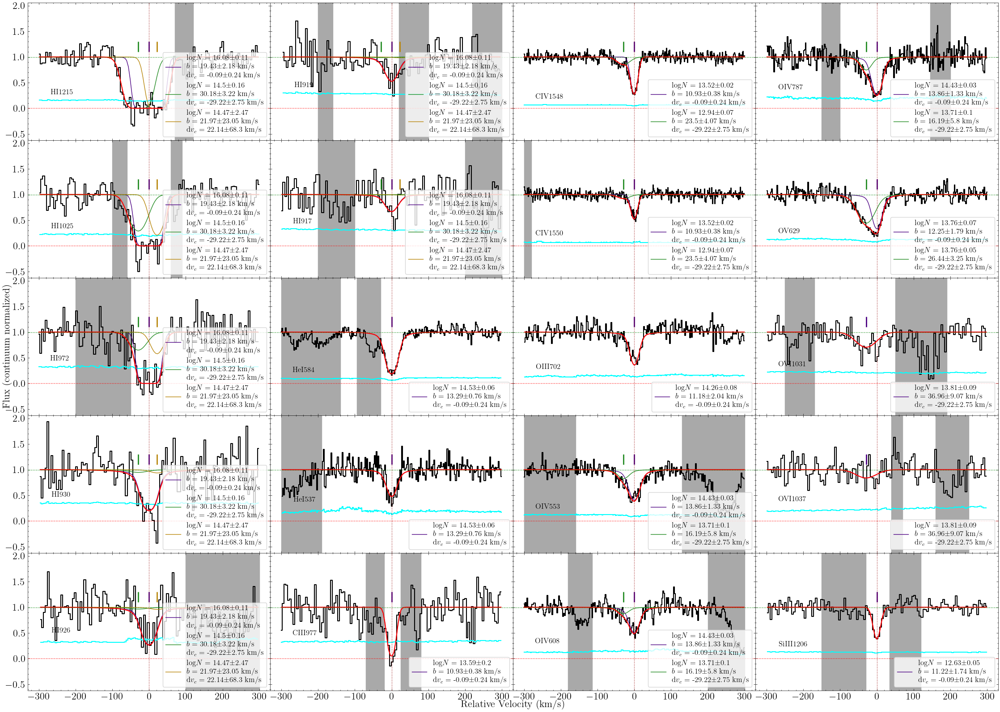

In [411]:
fig, axes = hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.plot_ion_suite_best_fit(n_cols=4)

In [412]:
len(hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.result.var_names)

30

In [413]:
#[v for v in hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.result.var_names if 'logN' in v]

In [414]:
hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.fit_ion_suite_emcee(loaddir=rootdir, n_walkers=200, n_steps=5000, scale_covar=1e-18)
#hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.fit_ion_suite_emcee(load=True, loaddir=rootdir)

100%|█████████████████████████████████████| 5000/5000 [4:19:47<00:00,  3.12s/it]


The chain is shorter than 50 times the integrated autocorrelation time for 30 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 100;
tau: [361.2040853  380.67241019 360.41947705 380.0850309  343.93625825
 499.78831784 371.11857307 388.46690678 396.88631357 360.67016476
 380.51793356 407.77856885 402.19805122 407.62351752 387.60910277
 355.92023917 347.65221179 436.95773822 368.2817634  385.00668783
 354.09004004 423.85201069 392.38581131 356.19829532 441.23886989
 346.58163402 367.54908687 365.32855985 331.1336151  326.28032105]


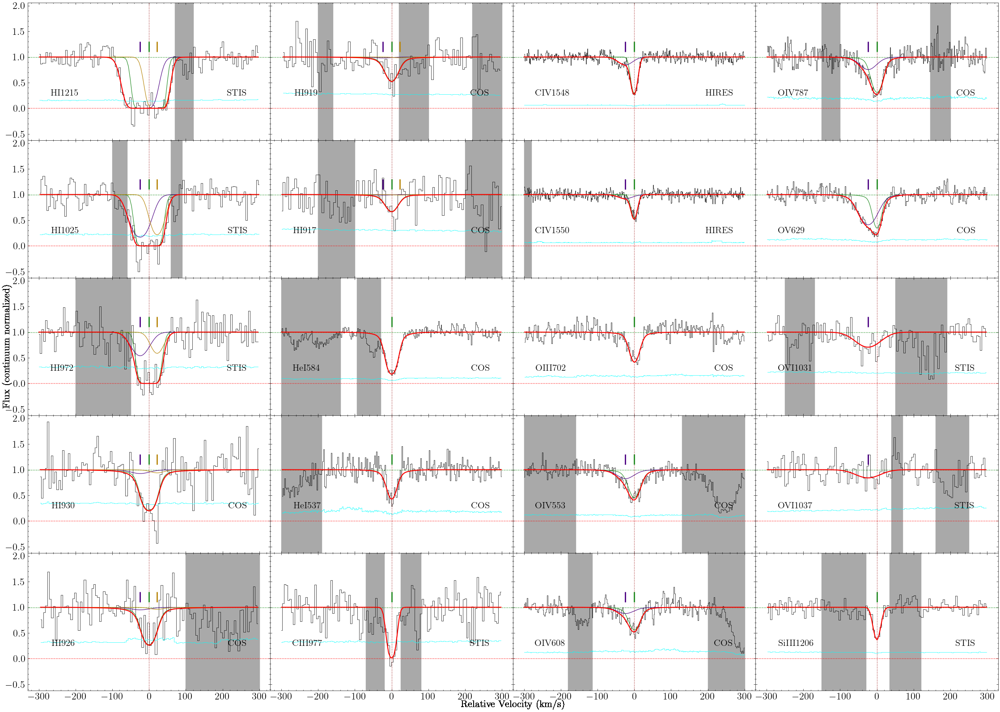

In [415]:
fig, axes = hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.plot_samples(n_cols=4)

In [417]:
#hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.plot_corner()

In [418]:
#df_slice = hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.result_emcee.flatchain[['it1c1_logN', 'it1c1_b', 'it10c1_logN', 'it10c1_b']]

In [419]:
#corner_plot = corner.corner(df_slice, 
#              labels=list(df_slice.columns),
#              quantiles=(1-cdf_1sig, 0.5, cdf_1sig),
#              show_titles=True, plot_density=True, 
#              levels=[2*cdf_1sig-1, 2*cdf_2sig-1], 
#              contour_kwargs={'colors':'red'})

In [425]:
np.median(hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.result_emcee.flatchain['it1c3_b'])

22.503391630685105

In [426]:
np.median(hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.result_emcee.flatchain['it10c1_logN'])-np.percentile(hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.result_emcee.flatchain['it10c1_logN'], 100*(1-cdf_1sig))

0.2472628809714994

In [428]:
np.median(hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.result_emcee.flatchain['it17c1_b'])

10.500944347459113

In [429]:
np.percentile(hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.result_emcee.flatchain['it10c1_logN'], 100*(1-cdf_3sig))

13.106205084265174

In [430]:
#np.percentile(hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii.result_emcee.flatchain['it10c1_b'], 100*cdf_3sig)

# Summary List
Now compile a summary list

In [431]:
summary = ion_summary([hi_hei_ciii_civ_oiii_oiv_ov_ovi_siiii])

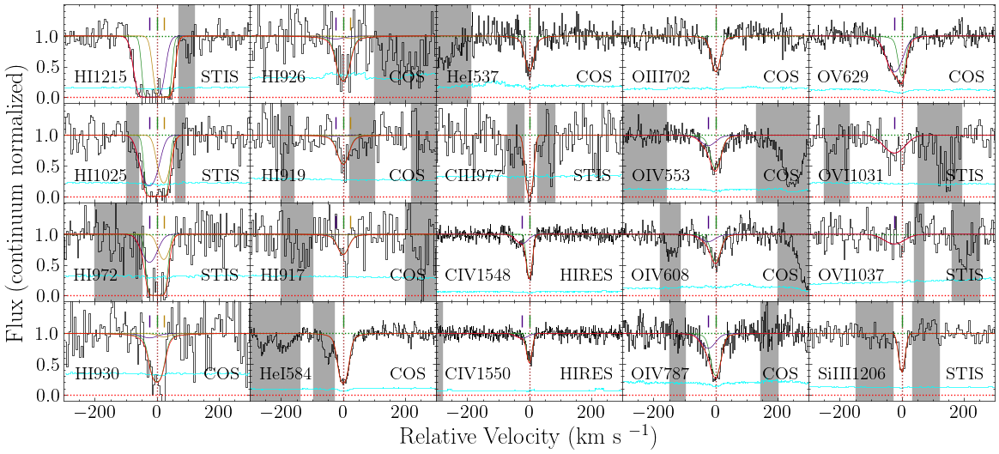

In [432]:
fig, axes = plt.subplots(4, 5, figsize=(5*2.8, 4*1.5), sharex=True, sharey=True)

summary.plot_samples(fig = fig, axes=axes, n_cols=5)

axes[0,0].set_ylim(-0.1,1.52)
axes[0,0].set_xlim(-299.9,299.9)
axes[0,0].set_yticks([0,0.5,1])

plt.savefig(rootdir+'Ions/z={}/z={}_vp_alt.pdf'.format(str(z_sys), str(z_sys).replace('.', '_')), dpi=300)

In [424]:
summary.print_summary()

HI1215
dv_c = -0.0 \pm 0.3, logN = 16.08 \pm 0.11, b = 19.4_{-2.9}^{+2.2}
dv_c = -24.0_{-2.8}^{+2.9}, logN = 14.67 \pm 0.17, b = 31.5_{-2.8}^{+3.2}
dv_c = 22.2_{-8.3}^{+6.7}, logN = 14.47_{-0.43}^{+0.24}, b = 22.5_{-3.9}^{+4.9}
HI1025
dv_c = -0.0 \pm 0.3, logN = 16.08 \pm 0.11, b = 19.4_{-2.9}^{+2.2}
dv_c = -24.0_{-2.8}^{+2.9}, logN = 14.67 \pm 0.17, b = 31.5_{-2.8}^{+3.2}
dv_c = 22.2_{-8.3}^{+6.7}, logN = 14.47_{-0.43}^{+0.24}, b = 22.5_{-3.9}^{+4.9}
HI972
dv_c = -0.0 \pm 0.3, logN = 16.08 \pm 0.11, b = 19.4_{-2.9}^{+2.2}
dv_c = -24.0_{-2.8}^{+2.9}, logN = 14.67 \pm 0.17, b = 31.5_{-2.8}^{+3.2}
dv_c = 22.2_{-8.3}^{+6.7}, logN = 14.47_{-0.43}^{+0.24}, b = 22.5_{-3.9}^{+4.9}
HI930
dv_c = -0.0 \pm 0.3, logN = 16.08 \pm 0.11, b = 19.4_{-2.9}^{+2.2}
dv_c = -24.0_{-2.8}^{+2.9}, logN = 14.67 \pm 0.17, b = 31.5_{-2.8}^{+3.2}
dv_c = 22.2_{-8.3}^{+6.7}, logN = 14.47_{-0.43}^{+0.24}, b = 22.5_{-3.9}^{+4.9}
HI926
dv_c = -0.0 \pm 0.3, logN = 16.08 \pm 0.11, b = 19.4_{-2.9}^{+2.2}
dv_c = -24.0_{-2.

# HeI (re-c2: upper limit)

## HeI 584

In [433]:
hei_584_fuv = ion_transition('HeI', 584, 'He', z_sys, 'COS FUV')

In [434]:
hei_584_fuv.grab_ion_transition_info()

In [435]:
hei_584_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-140], [-95,-30]])

In [436]:
hei_584_fuv.cont_norm_flux(v_abs_range=[-75,50], degree=1)

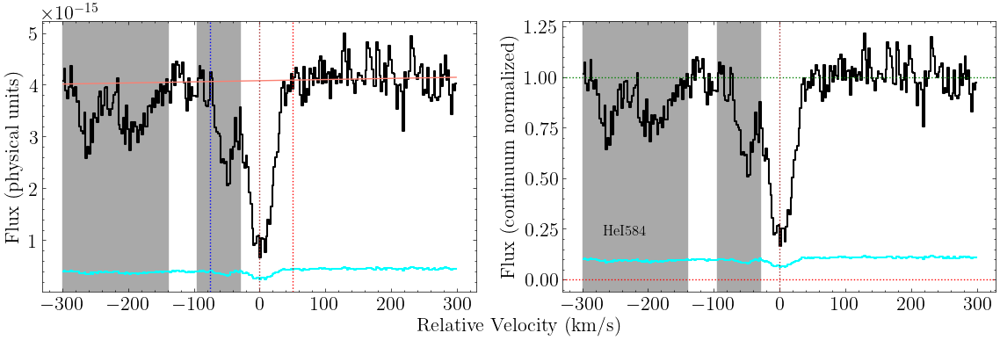

In [437]:
fig, ax = hei_584_fuv.plot_ion_transition_spec_cont()

In [438]:
hei_584_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [439]:
hei_584_fuv.get_upper_lim(30)

logN-1sig: 12.5
logN-2sig: 12.7
logN-3sig: 12.9


In [440]:
hei_584_fuv.get_upper_lim_data(30, 60, 40, 200, logN_max=20)

logN-1sig: 12.8
logN-2sig: 13.0
logN-3sig: 13.1


In [441]:
logN_grid, chi_sq_grid, pdf, cdf = hei_584_fuv.get_upper_lim_data(30, -25, -200, -30, logN_max=20, return_grids=True)

logN-1sig: 14.0
logN-2sig: 14.1
logN-3sig: 14.1


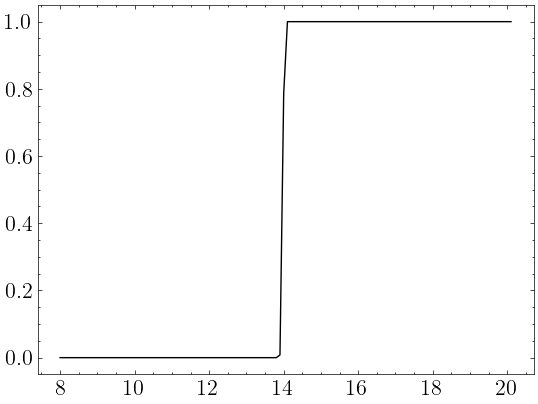

In [442]:
plt.plot(logN_grid, cdf)

## HeI 537

In [443]:
hei_537_fuv = ion_transition('HeI', 537, 'He', z_sys, 'COS FUV')

In [444]:
hei_537_fuv.grab_ion_transition_info()

In [445]:
hei_537_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-190]])

In [446]:
hei_537_fuv.cont_norm_flux(v_abs_range=[-40,50], degree=1)

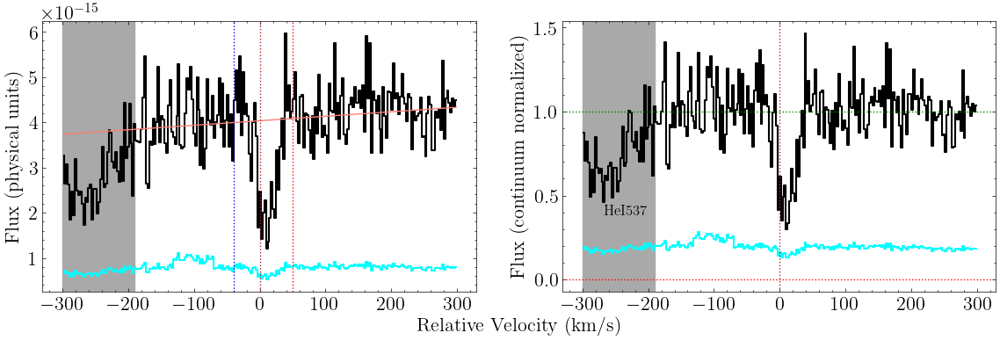

In [447]:
fig, ax = hei_537_fuv.plot_ion_transition_spec_cont()

In [448]:
hei_537_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [449]:
hei_537_fuv.get_upper_lim(30, logN_max=20)

logN-1sig: 13.5
logN-2sig: 13.7
logN-3sig: 13.9


In [450]:
hei_537_fuv.get_upper_lim_data(30, -25, -200, -30, logN_max=20)

logN-1sig: 13.6
logN-2sig: 13.9
logN-3sig: 14.1


# CIII (re-c2: upper limit)

## CIII 977 (STIS)

In [451]:
ciii_977_stis = ion_transition('CIII', 977, 'C', z_sys, 'STIS')

In [452]:
ciii_977_stis.grab_ion_transition_info()

In [453]:
ciii_977_stis.grab_ion_transition_spec(spec_fits_list)

In [454]:
ciii_977_stis.cont_norm_flux(v_abs_range=[-60,60], degree=1)

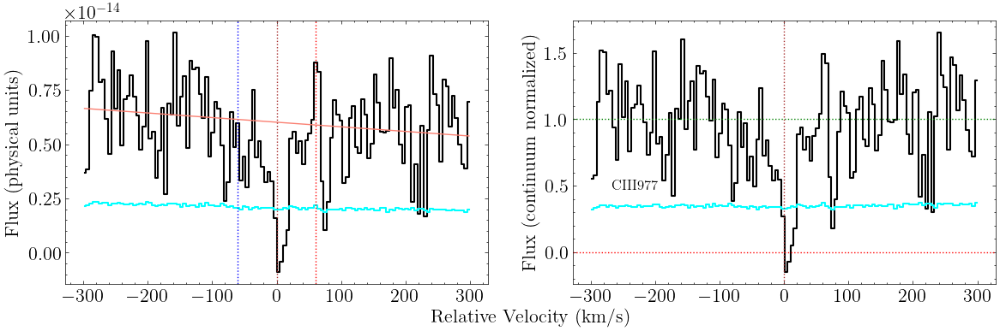

In [455]:
fig, ax = ciii_977_stis.plot_ion_transition_spec_cont()

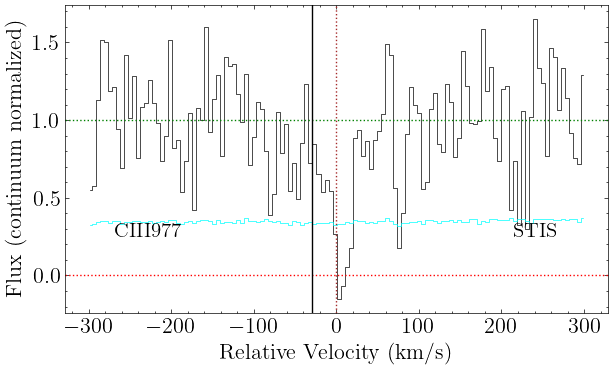

In [456]:
fig, ax = ciii_977_stis.plot_ion_transition_spec()
ax.axvline(-30)

In [457]:
ciii_977_stis.grab_ion_transition_lsf(lsf_fits_list)

In [458]:
ciii_977_stis.get_upper_lim(30)

logN-1sig: 12.7
logN-2sig: 12.9
logN-3sig: 13.1


In [459]:
ciii_977_stis.get_upper_lim_data(30, -25, -300, -30, logN_max=20)

logN-1sig: 13.3
logN-2sig: 13.5
logN-3sig: 13.6


# OII

## OII 834 (NUV)

In [460]:
oii_834_nuv = ion_transition('OII', 833, 'O', z_sys, 'COS NUV')

In [461]:
oii_834_nuv.grab_ion_transition_info()

In [462]:
oii_834_nuv.f, oii_834_nuv.gamma

(0.0444, 0.016655144)

In [463]:
oii_834_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[10,100]])

In [464]:
oii_834_nuv.cont_norm_flux(renorm=True, v_abs_range=[-100,100], degree=1)

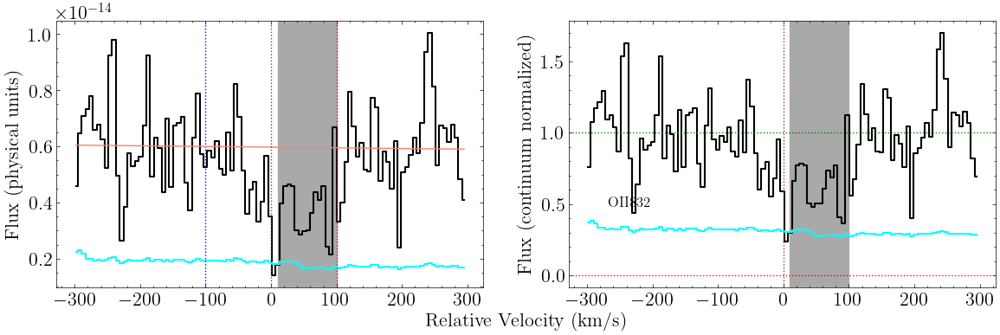

In [465]:
fig, axes = oii_834_nuv.plot_ion_transition_spec_cont()

In [466]:
oii_834_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [467]:
oii_834_nuv.get_upper_lim(10, logN_max=20)

logN-1sig: 14.1
logN-2sig: 14.4
logN-3sig: 14.7


In [468]:
oii_834_nuv.get_upper_lim_data(10, 0, -50, 10, logN_max=20)

logN-1sig: 18.7
logN-2sig: 19.1
logN-3sig: 19.5


In [469]:
oii_834_nuv.get_upper_lim(30)

logN-1sig: 13.9
logN-2sig: 14.0
logN-3sig: 14.0


# OIII (re-c2: upper limit)

## OIII 702

In [470]:
oiii_702_fuv = ion_transition('OIII', 702,  'O', z_sys, 'COS FUV')

In [471]:
oiii_702_fuv.grab_ion_transition_info()

In [472]:
oiii_702_fuv.grab_ion_transition_spec(spec_fits_list)

In [473]:
oiii_702_fuv.cont_norm_flux(v_abs_range=[-80,40], degree=1)

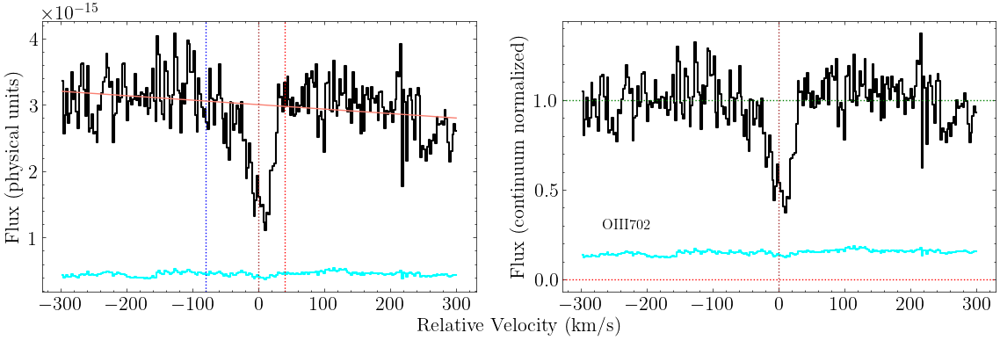

In [474]:
fig, ax = oiii_702_fuv.plot_ion_transition_spec_cont()

In [475]:
oiii_702_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [476]:
oiii_702_fuv.get_upper_lim(30)

logN-1sig: 13.0
logN-2sig: 13.3
logN-3sig: 13.4


In [477]:
oiii_702_fuv.get_upper_lim_data(30, -25, -300, -30, logN_max=20)

logN-1sig: 13.6
logN-2sig: 13.8
logN-3sig: 13.9


# OVI (re-c1: upper limit)

## OVI 1031 (STIS)

In [478]:
ovi_1031_stis = ion_transition('OVI', 1031, 'O', z_sys, 'STIS')

In [479]:
ovi_1031_stis.grab_ion_transition_info()

In [480]:
ovi_1031_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-250,-170],[110,190]])

In [481]:
ovi_1031_stis.cont_norm_flux(v_abs_range=[-70,60], degree=1)

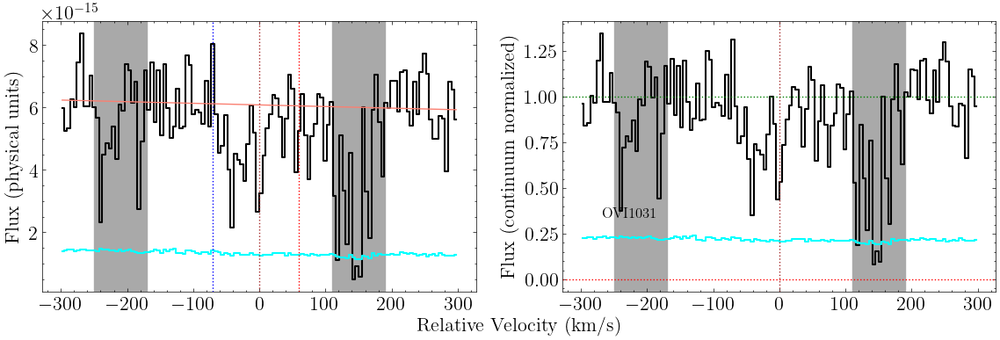

In [482]:
fig, ax = ovi_1031_stis.plot_ion_transition_spec_cont()

In [483]:
ovi_1031_stis.grab_ion_transition_lsf(lsf_fits_list)

In [484]:
ovi_1031_stis.get_upper_lim(30)

logN-1sig: 13.2
logN-2sig: 13.4
logN-3sig: 13.6


## OVI 1037 (STIS)

In [485]:
ovi_1037_stis = ion_transition('OVI', 1037, 'O', z_sys, 'STIS')

In [486]:
ovi_1037_stis.grab_ion_transition_info()
#ovi_1037_stis.grab_ion_transition_info(ids_fits_list, atomic_data_table, delta_v=0)

In [487]:
ovi_1037_stis.grab_ion_transition_spec(spec_fits_list, masks=[[40,70],[160,220]])

In [488]:
ovi_1037_stis.cont_norm_flux(v_abs_range=[-70,70], degree=1)

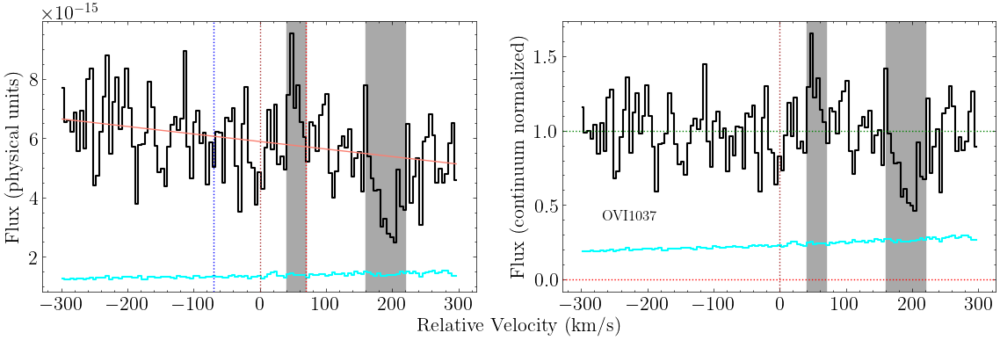

In [489]:
fig, ax = ovi_1037_stis.plot_ion_transition_spec_cont()

In [490]:
ovi_1037_stis.grab_ion_transition_lsf(lsf_fits_list)

In [491]:
ovi_1037_stis.get_upper_lim(30)

logN-1sig: 13.5
logN-2sig: 13.8
logN-3sig: 13.9


# NeVIII

## NeVIII 770

In [492]:
neviii_770_nuv = ion_transition('NeVIII', 770, 'Ne', z_sys, 'COS FUV')

In [493]:
neviii_770_nuv.grab_ion_transition_info()

In [494]:
neviii_770_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-170],[40,300]])

In [495]:
neviii_770_nuv.cont_norm_flux(renorm=True, v_abs_range=[-50,20], degree=1)

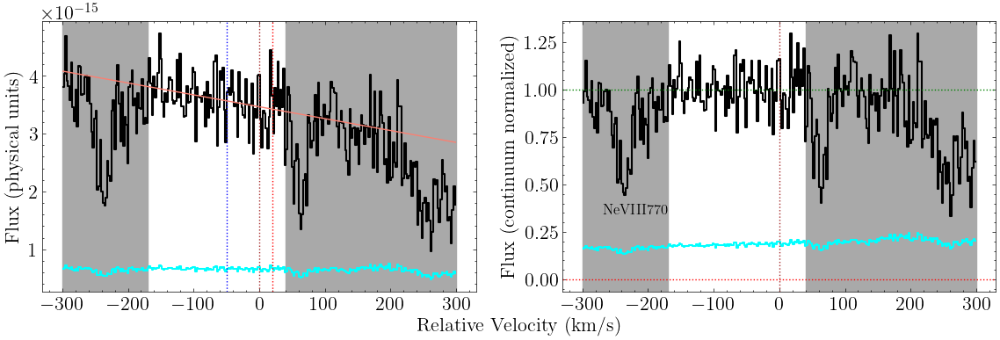

In [496]:
fig, axes = neviii_770_nuv.plot_ion_transition_spec_cont()

In [497]:
neviii_770_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [498]:
neviii_770_nuv.get_upper_lim(30)

logN-1sig: 13.2
logN-2sig: 13.4
logN-3sig: 13.6


In [499]:
neviii_770_nuv.get_upper_lim_data(30, -25, -200, 20)

logN-1sig: 13.3
logN-2sig: 13.5
logN-3sig: 13.7


In [500]:
neviii_770_nuv.get_upper_lim(45)

logN-1sig: 13.3
logN-2sig: 13.5
logN-3sig: 13.7


## NeVIII 780

In [501]:
neviii_780_nuv = ion_transition('NeVIII', 780, 'Ne', z_sys, 'COS FUV')

In [502]:
neviii_780_nuv.grab_ion_transition_info()

In [503]:
neviii_780_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[-220,-70]])

In [504]:
neviii_780_nuv.cont_norm_flux(renorm=True, v_abs_range=[-100,100], degree=1)

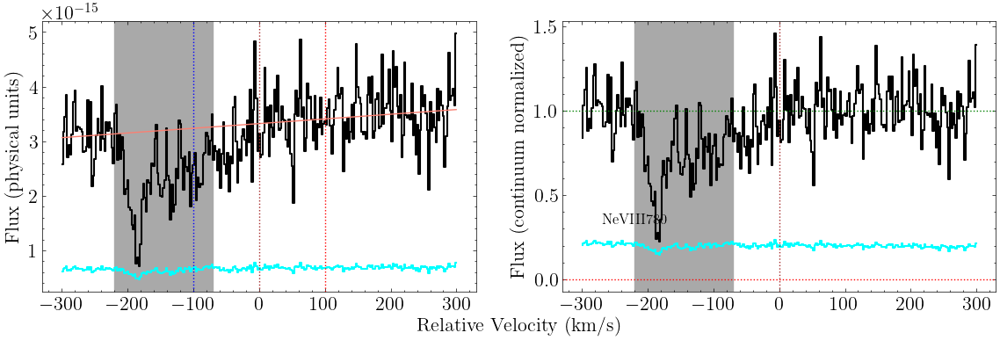

In [505]:
fig, axes = neviii_780_nuv.plot_ion_transition_spec_cont()

In [506]:
neviii_780_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [507]:
neviii_780_nuv.get_upper_lim(30)

logN-1sig: 13.6
logN-2sig: 13.8
logN-3sig: 13.9


In [508]:
neviii_780_nuv.get_upper_lim(45)

logN-1sig: 13.6
logN-2sig: 13.8
logN-3sig: 14.0


# MgII

## MgII 1240 (STIS)

In [509]:
mgii_1240_stis = ion_transition('MgII', 1240, 'Mg', z_sys, 'STIS')

In [510]:
mgii_1240_stis.grab_ion_transition_info()

In [511]:
mgii_1240_stis.grab_ion_transition_spec(spec_fits_list)

In [512]:
mgii_1240_stis.cont_norm_flux(renorm=True, v_abs_range=[-100,100], degree=1)

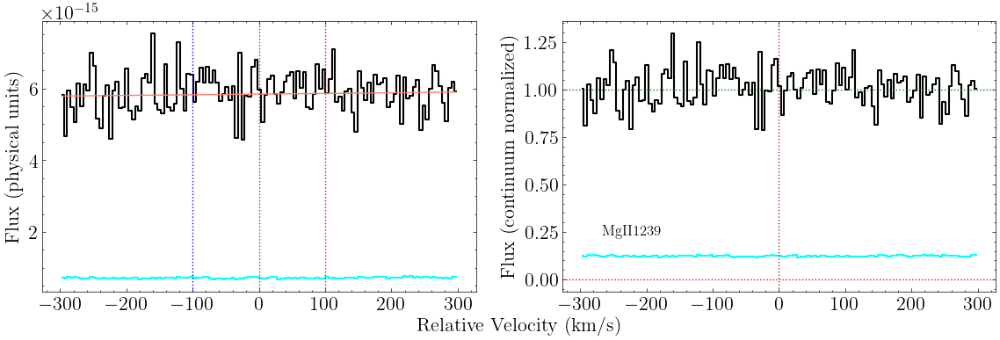

In [513]:
fig, axes = mgii_1240_stis.plot_ion_transition_spec_cont()

In [514]:
mgii_1240_stis.grab_ion_transition_lsf(lsf_fits_list)

In [515]:
mgii_1240_stis.get_upper_lim(10, logN_max=20)

logN-1sig: 15.0
logN-2sig: 15.2
logN-3sig: 15.4


In [516]:
mgii_1240_stis.get_upper_lim(30, logN_max=20)

logN-1sig: 15.2
logN-2sig: 15.4
logN-3sig: 15.6


# MgX

## MgX 609

In [517]:
mgx_609_fuv = ion_transition('MgX', 609, 'Mg', z_sys, 'COS FUV')

In [518]:
mgx_609_fuv.grab_ion_transition_info()

In [519]:
mgx_609_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-150]])

In [520]:
mgx_609_fuv.cont_norm_flux(renorm=True, v_abs_range=[-100,100], degree=1)

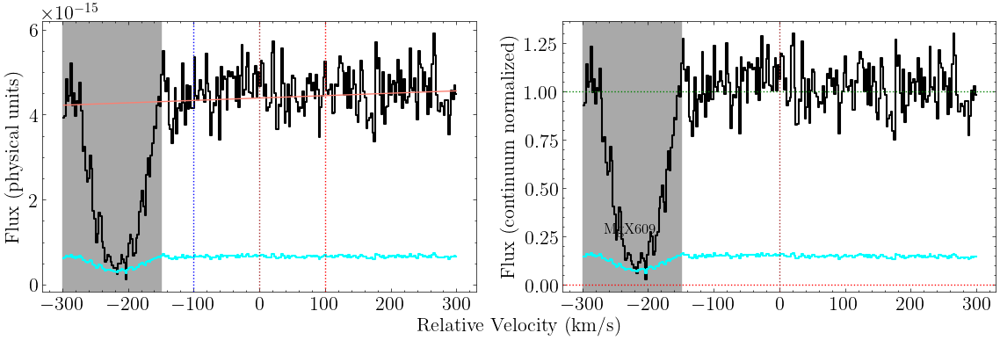

In [521]:
fig, axes = mgx_609_fuv.plot_ion_transition_spec_cont()

In [522]:
mgx_609_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [523]:
mgx_609_fuv.get_upper_lim(30)

logN-1sig: 13.3
logN-2sig: 13.5
logN-3sig: 13.7


In [524]:
mgx_609_fuv.get_upper_lim(45)

logN-1sig: 13.4
logN-2sig: 13.6
logN-3sig: 13.8


# AlII

## AlII 1670 (HIRES)

In [525]:
alii_1670_hires = ion_transition('AlII', 1670, 'Al', z_sys, 'HIRES')

In [526]:
alii_1670_hires.grab_ion_transition_info()

In [527]:
alii_1670_hires.grab_ion_transition_spec(spec_fits_list, masks=[[-60,-40]])

In [528]:
alii_1670_hires.cont_norm_flux(renorm=True, v_abs_range=[-100,100], degree=1)

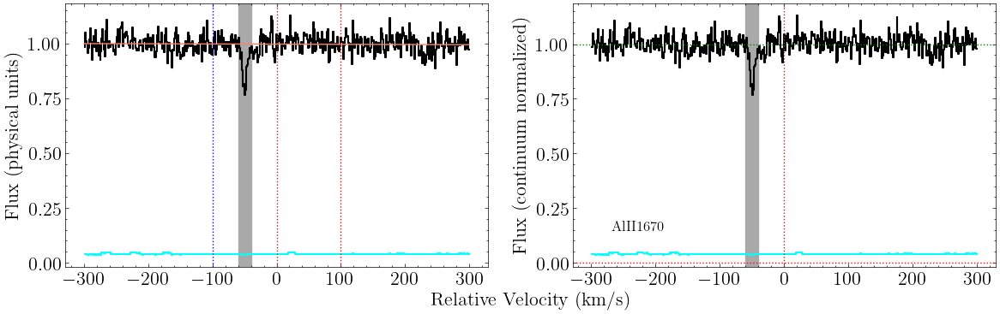

In [529]:
fig, axes = alii_1670_hires.plot_ion_transition_spec_cont()

In [530]:
alii_1670_hires.grab_ion_transition_lsf(lsf_fits_list)

In [531]:
alii_1670_hires.get_upper_lim(10)

logN-1sig: 10.6
logN-2sig: 10.8
logN-3sig: 11.0


In [532]:
alii_1670_hires.get_upper_lim(30)

logN-1sig: 10.8
logN-2sig: 11.0
logN-3sig: 11.2


# AlIII

## AlIII 1862 (HIRES)

In [533]:
aliii_1862_hires = ion_transition('AlIII', 1862, 'Al', z_sys, 'HIRES')

In [534]:
aliii_1862_hires.grab_ion_transition_info()

In [535]:
aliii_1862_hires.grab_ion_transition_spec(spec_fits_list)

In [536]:
aliii_1862_hires.cont_norm_flux(renorm=True, v_abs_range=[-100,100], degree=1)

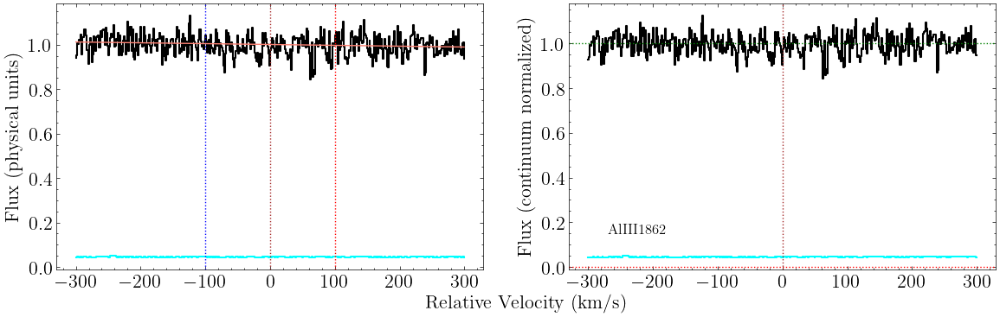

In [537]:
fig, axes = aliii_1862_hires.plot_ion_transition_spec_cont()

In [538]:
aliii_1862_hires.grab_ion_transition_lsf(lsf_fits_list)

In [539]:
aliii_1862_hires.get_upper_lim(10)

logN-1sig: 11.4
logN-2sig: 11.6
logN-3sig: 11.8


In [540]:
aliii_1862_hires.get_upper_lim(30)

logN-1sig: 11.6
logN-2sig: 11.8
logN-3sig: 12.0


## AlIII 1854 (HIRES)

In [541]:
aliii_1854_hires = ion_transition('AlIII', 1854, 'Al', z_sys, 'HIRES')

In [542]:
aliii_1854_hires.grab_ion_transition_info()

In [543]:
aliii_1854_hires.grab_ion_transition_spec(spec_fits_list)

In [544]:
aliii_1854_hires.cont_norm_flux(renorm=True, v_abs_range=[-100,100], degree=1)

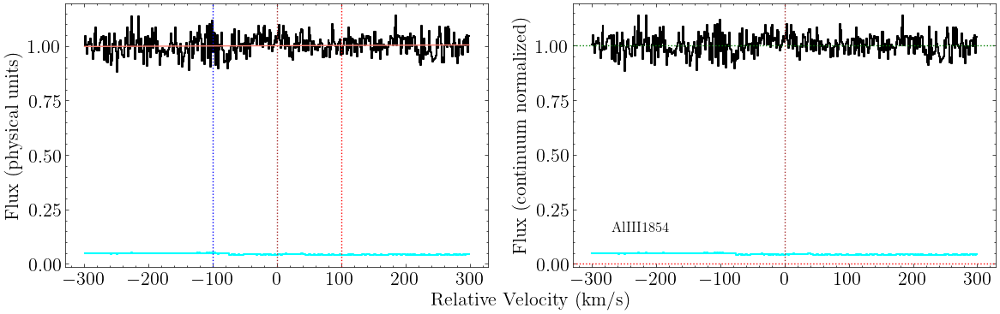

In [545]:
fig, axes = aliii_1854_hires.plot_ion_transition_spec_cont()

In [546]:
aliii_1854_hires.grab_ion_transition_lsf(lsf_fits_list)

In [547]:
aliii_1854_hires.get_upper_lim(10)

logN-1sig: 11.1
logN-2sig: 11.3
logN-3sig: 11.5


In [548]:
aliii_1854_hires.get_upper_lim(30)

logN-1sig: 11.3
logN-2sig: 11.5
logN-3sig: 11.7


# SiII

## SiII 1260 (STIS)

In [549]:
siii_1260_stis = ion_transition('SiII', 1260, 'Si', z_sys, 'STIS')

In [550]:
siii_1260_stis.grab_ion_transition_info()

In [551]:
siii_1260_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-110]])

In [552]:
siii_1260_stis.cont_norm_flux(renorm=True, v_abs_range=[-100,100], degree=1)

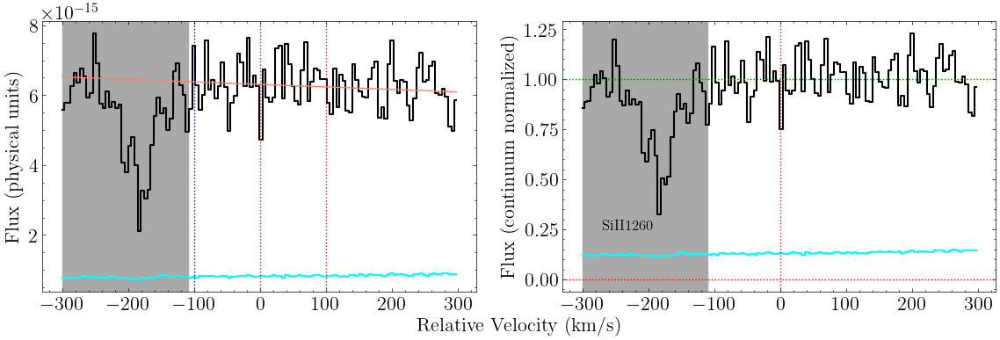

In [553]:
fig, axes = siii_1260_stis.plot_ion_transition_spec_cont()

In [554]:
siii_1260_stis.grab_ion_transition_lsf(lsf_fits_list)

In [555]:
siii_1260_stis.get_upper_lim(10)

logN-1sig: 11.7
logN-2sig: 12.0
logN-3sig: 12.1


In [556]:
siii_1260_stis.get_upper_lim(30)

logN-1sig: 11.9
logN-2sig: 12.1
logN-3sig: 12.3


## SiII 1193 (STIS)

In [557]:
siii_1193_stis = ion_transition('SiII', 1193, 'Si', z_sys, 'STIS')

In [558]:
siii_1193_stis.grab_ion_transition_info()

In [559]:
siii_1193_stis.grab_ion_transition_spec(spec_fits_list, masks=[[120,300]])

In [560]:
siii_1193_stis.cont_norm_flux(renorm=True, v_abs_range=[-100,100], degree=1)

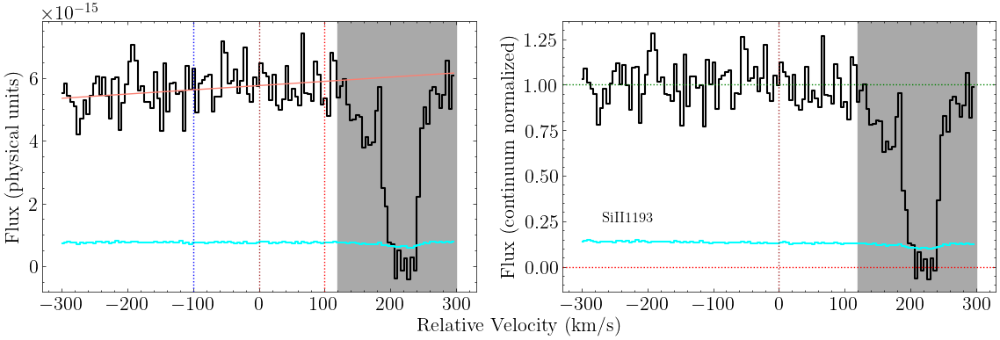

In [561]:
fig, axes = siii_1193_stis.plot_ion_transition_spec_cont()

In [562]:
siii_1193_stis.grab_ion_transition_lsf(lsf_fits_list)

In [563]:
siii_1193_stis.get_upper_lim(10)

logN-1sig: 12.1
logN-2sig: 12.3
logN-3sig: 12.5


In [564]:
siii_1193_stis.get_upper_lim(30)

logN-1sig: 12.3
logN-2sig: 12.5
logN-3sig: 12.6


# SiIII (re: upper limits)

## SiIII 1206 (STIS)

In [565]:
siiii_1206_stis = ion_transition('SiIII', 1206, 'Si', z_sys, 'STIS')

In [566]:
siiii_1206_stis.grab_ion_transition_info(delta_v=5)

In [567]:
siiii_1206_stis.grab_ion_transition_spec(spec_fits_list)

In [568]:
siiii_1206_stis.cont_norm_flux(v_abs_range=[-20,35], degree=1)

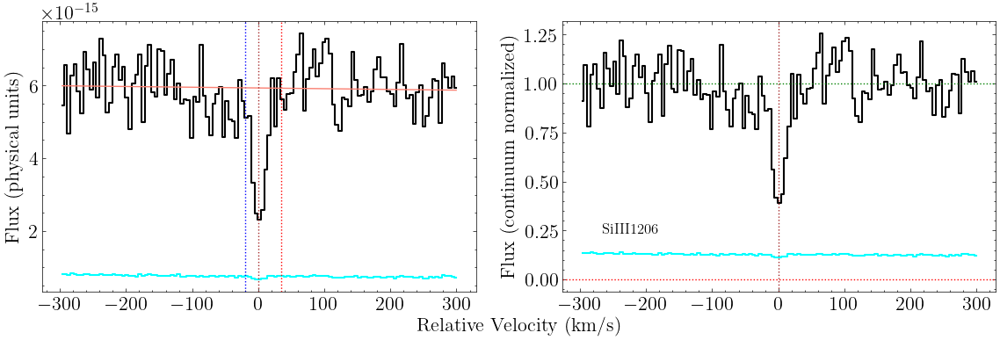

In [569]:
fig, ax = siiii_1206_stis.plot_ion_transition_spec_cont()

In [570]:
siiii_1206_stis.grab_ion_transition_lsf(lsf_fits_list)

In [571]:
siiii_1206_stis.get_upper_lim(30)

logN-1sig: 11.8
logN-2sig: 12.0
logN-3sig: 12.1


# FeII

## FeII 2600 (HIRES)

In [572]:
feii_2600_hires = ion_transition('FeII', 2600, 'Fe', z_sys, 'HIRES')

In [573]:
feii_2600_hires.grab_ion_transition_info()

In [574]:
feii_2600_hires.grab_ion_transition_spec(spec_fits_list)

In [575]:
feii_2600_hires.cont_norm_flux(renorm=True, v_abs_range=[-100,100], degree=1)

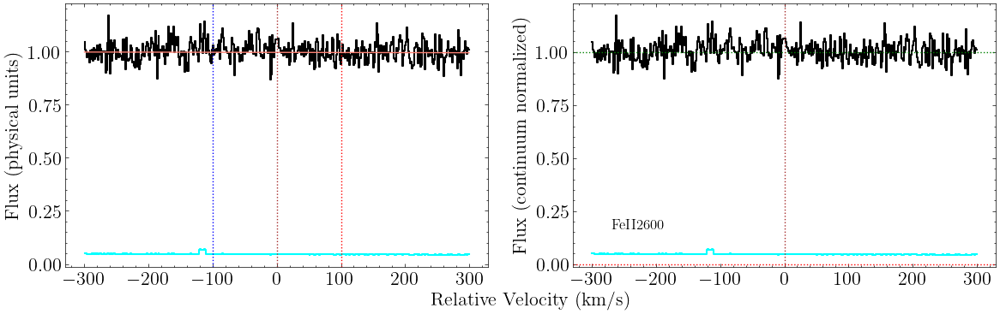

In [576]:
fig, axes = feii_2600_hires.plot_ion_transition_spec_cont()

In [577]:
feii_2600_hires.grab_ion_transition_lsf(lsf_fits_list)

In [578]:
feii_2600_hires.get_upper_lim(10)

logN-1sig: 11.3
logN-2sig: 11.5
logN-3sig: 11.7


In [579]:
feii_2600_hires.get_upper_lim(30)

logN-1sig: 11.6
logN-2sig: 11.8
logN-3sig: 11.9


## FeII 2382 (HIRES)

In [580]:
feii_2382_hires = ion_transition('FeII', 2382, 'Fe', z_sys, 'HIRES')

In [581]:
feii_2382_hires.grab_ion_transition_info()

In [582]:
feii_2382_hires.grab_ion_transition_spec(spec_fits_list)

In [583]:
feii_2382_hires.cont_norm_flux(renorm=True, v_abs_range=[-100,100], degree=1)

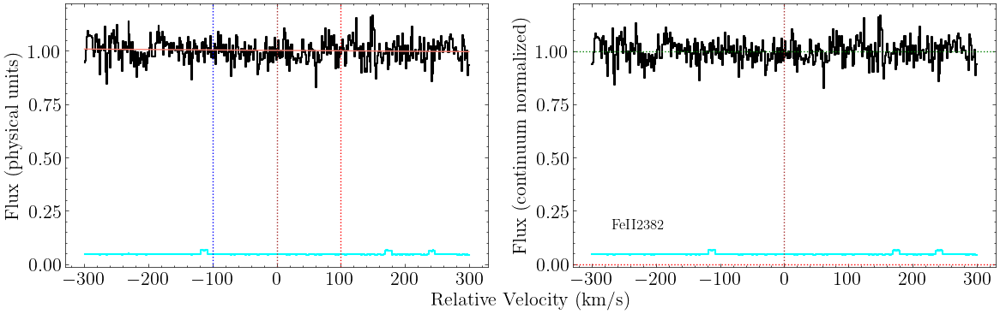

In [584]:
fig, axes = feii_2382_hires.plot_ion_transition_spec_cont()

In [585]:
feii_2382_hires.grab_ion_transition_lsf(lsf_fits_list)

In [586]:
feii_2382_hires.get_upper_lim(10)

logN-1sig: 11.2
logN-2sig: 11.5
logN-3sig: 11.6


In [587]:
feii_2382_hires.get_upper_lim(30)

logN-1sig: 11.5
logN-2sig: 11.7
logN-3sig: 11.8


## FeII 2344 (HIRES)

In [588]:
feii_2344_hires = ion_transition('FeII', 2344, 'Fe', z_sys, 'HIRES')

In [589]:
feii_2344_hires.grab_ion_transition_info()

In [590]:
feii_2344_hires.grab_ion_transition_spec(spec_fits_list)

In [591]:
feii_2344_hires.cont_norm_flux(renorm=True, v_abs_range=[-100,100], degree=1)

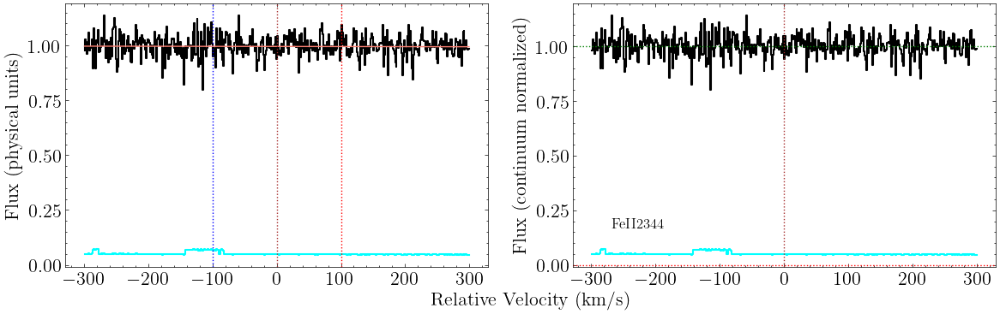

In [592]:
fig, axes = feii_2344_hires.plot_ion_transition_spec_cont()

In [593]:
feii_2344_hires.grab_ion_transition_lsf(lsf_fits_list)

In [594]:
feii_2344_hires.get_upper_lim(10)

logN-1sig: 11.7
logN-2sig: 11.9
logN-3sig: 12.1


In [595]:
feii_2344_hires.get_upper_lim(30)

logN-1sig: 11.9
logN-2sig: 12.2
logN-3sig: 12.3


# Presentation plot

FileNotFoundError: [Errno 2] No such file or directory: '/Users/thepoetoftwilight/Documents/CUBS/Data/PG1522+101/Figures/b_NT.png'

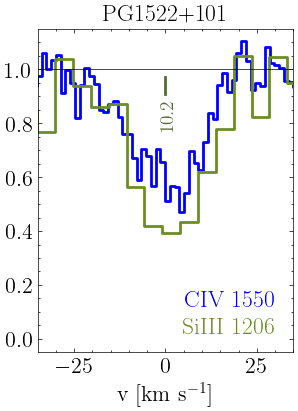

In [596]:
fig, ax = plt.subplots(1, figsize=(3.3,4.2))

ax.step(civ_1550_hires.v, civ_1550_hires.flux_norm, where='mid', color='blue', lw=2)
ax.step(siiii_1206_stis.v, siiii_1206_stis.flux_norm, where='mid', color='olivedrab', lw=2)

ax.text(30,0.12,'CIV 1550', color='blue', horizontalalignment='right', fontsize=17)
ax.text(30,0.02,'SiIII 1206', color='olivedrab', horizontalalignment='right', fontsize=17)

ax.axhline(1, lw=.5)

ax.axvline(0, ymin=0.80, ymax=0.85, color='darkolivegreen', lw=2)
ax.text(0.7, 0.78, '10.2', rotation=90, fontsize=14, color='darkolivegreen', horizontalalignment='center')
ax.set_xlim(-35,35)
ax.set_ylim(-0.2/4, 1.15)
ax.set_yticks([0.0,0.2,0.4,0.6,0.8,1.0],[0.0,0.2,0.4,0.6,0.8,1.0])

ax.set_title('PG1522+101', fontsize=17)
ax.set_xlabel(r'v [km s${}^{-1}$]')

plt.savefig('/Users/thepoetoftwilight/Documents/CUBS/Data/PG1522+101/Figures/b_NT.png', dpi=300)